# HATLAS-SGP: Validation Checks (10% SUBSET)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [37]:
t0 = time.time()

catname = "/data/help/master_catalogue_sgp_RANDOM10PCSAMPLE_20180221.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  92.64041686058044
Number of sources in master catalogue:  2979069


In [38]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

HATLAS-SGP


In [39]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [43]:
u_bands = ["OmegaCAM u"]
g_bands = ["OmegaCAM g", "DECam g", "GPC1 g"]
r_bands = ["OmegaCAM r", "DECam r", "GPC1 r"]
i_bands = ["OmegaCAM i", "DECam i", "GPC1 i"]
z_bands = ["OmegaCAM z", "DECam z", "GPC1 z", "VISTA Z"]
y_bands = [              "DECam y", "GPC1 y", "VISTA Y"]
J_bands = [                                   "VISTA J"]
H_bands = [                                   "VISTA H"]
K_bands = [                                   "VISTA Ks"]

all_bands = [g_bands, r_bands, i_bands, z_bands, y_bands]

irac_mags = []
other_mags = []

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_mags
all_mags = opt_mags + ir_mags + other_mags

In [44]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

OmegaCAM u mag (aperture)
    Error max: 42585
    magerr > 10: Number of objects = 6600, min mag = 25.5
    magerr > 100: Number of objects = 618, min mag = 28.3
    magerr > 1000: Number of objects = 67, min mag = 32.5

OmegaCAM u mag (total)
    Error max: 195540
    magerr > 10: Number of objects = 12017, min mag = 21.0
    magerr > 100: Number of objects = 1131, min mag = 28.6
    magerr > 1000: Number of objects = 109, min mag = 31.7



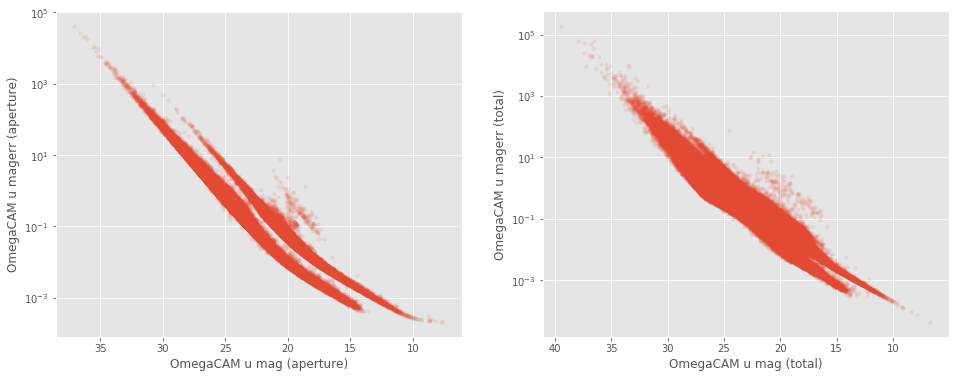

OmegaCAM g mag (aperture)
    Error max: 13137
    magerr > 10: Number of objects = 1631, min mag = 24.5
    magerr > 100: Number of objects = 165, min mag = 30.2
    magerr > 1000: Number of objects = 12, min mag = 33.6

OmegaCAM g mag (total)
    Error max: 1670738
    magerr > 10: Number of objects = 3141, min mag = 22.2
    magerr > 100: Number of objects = 284, min mag = 27.2
    magerr > 1000: Number of objects = 28, min mag = 29.6



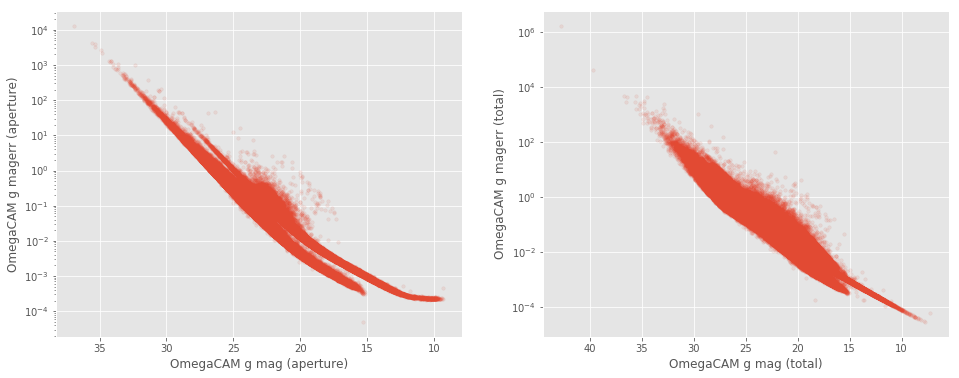

DECam g mag (aperture)
    Error max: 20489
    magerr > 10: Number of objects = 2163, min mag = 27.9
    magerr > 100: Number of objects = 211, min mag = 30.5
    magerr > 1000: Number of objects = 16, min mag = 33.7

DECam g mag (total)
    Error max: 19312
    magerr > 10: Number of objects = 3220, min mag = 27.3
    magerr > 100: Number of objects = 310, min mag = 30.3
    magerr > 1000: Number of objects = 24, min mag = 33.1



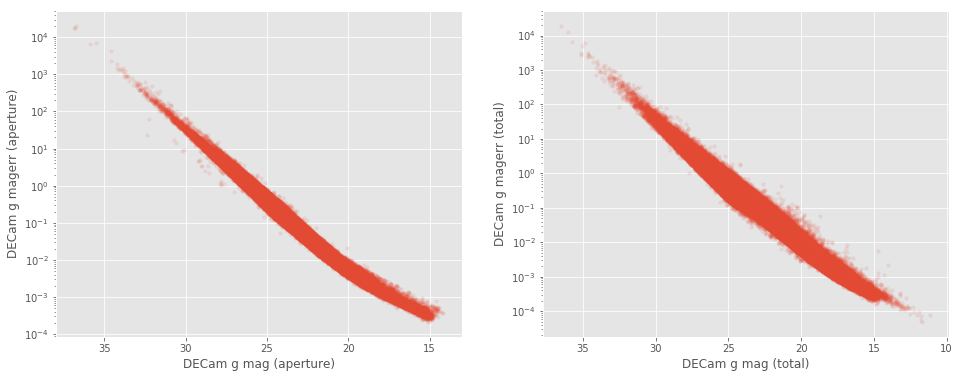

GPC1 g mag (aperture)
    Error max: 20178
    magerr > 10: Number of objects = 604, min mag = 22.3
    magerr > 100: Number of objects = 63, min mag = 26.5
    magerr > 1000: Number of objects = 5, min mag = 31.3

GPC1 g mag (total)
    Error max: 7696
    magerr > 10: Number of objects = 689, min mag = 22.0
    magerr > 100: Number of objects = 66, min mag = 25.3
    magerr > 1000: Number of objects = 4, min mag = 30.7



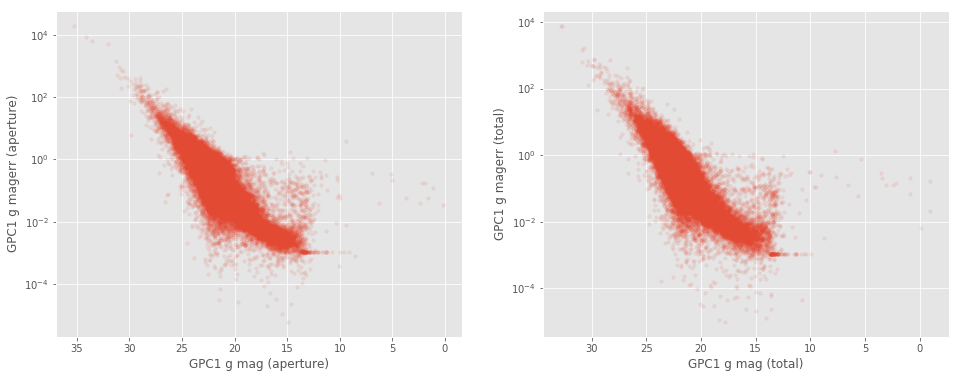

OmegaCAM r mag (aperture)
    Error max: 6100
    magerr > 10: Number of objects = 602, min mag = 23.9
    magerr > 100: Number of objects = 56, min mag = 29.7
    magerr > 1000: Number of objects = 6, min mag = 34.2

OmegaCAM r mag (total)
    Error max: 2096
    magerr > 10: Number of objects = 615, min mag = 24.3
    magerr > 100: Number of objects = 64, min mag = 28.7
    magerr > 1000: Number of objects = 5, min mag = 33.8



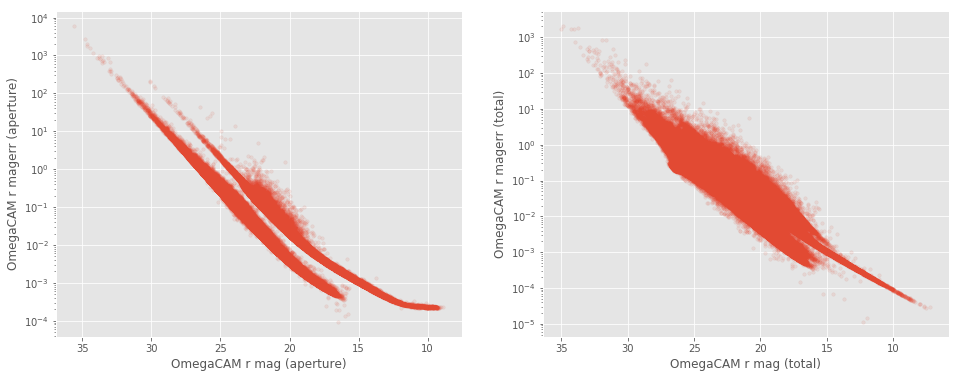

DECam r mag (aperture)
    Error max: 4238
    magerr > 10: Number of objects = 191, min mag = 27.9
    magerr > 100: Number of objects = 16, min mag = 30.6
    magerr > 1000: Number of objects = 2, min mag = 34.4

DECam r mag (total)
    Error max: 1057
    magerr > 10: Number of objects = 321, min mag = 27.3
    magerr > 100: Number of objects = 30, min mag = 30.5
    magerr > 1000: Number of objects = 1, min mag = 33.0



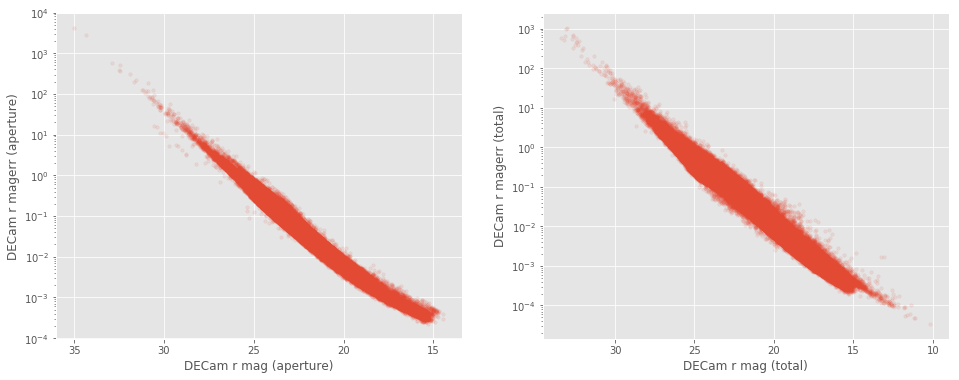

GPC1 r mag (aperture)
    Error max: 4564
    magerr > 10: Number of objects = 278, min mag = 5.7
    magerr > 100: Number of objects = 20, min mag = 26.7
    magerr > 1000: Number of objects = 3, min mag = 30.8

GPC1 r mag (total)
    Error max: 6193
    magerr > 10: Number of objects = 280, min mag = 21.9
    magerr > 100: Number of objects = 29, min mag = 27.0
    magerr > 1000: Number of objects = 3, min mag = 30.0



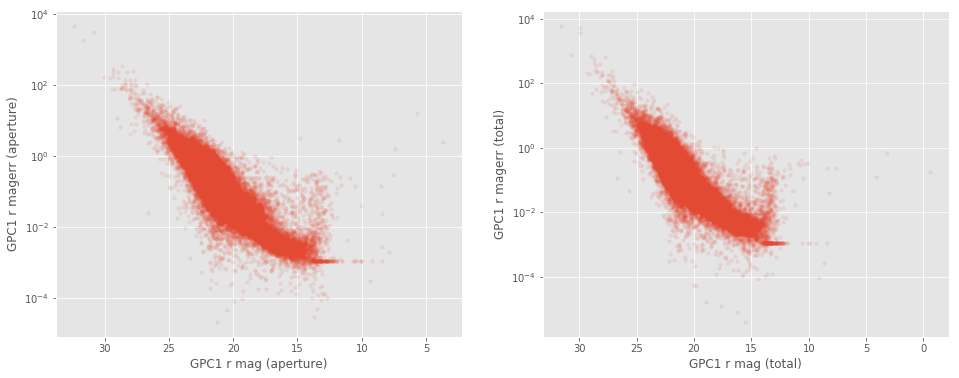

OmegaCAM i mag (aperture)
    Error max: 12474
    magerr > 10: Number of objects = 3225, min mag = 23.7
    magerr > 100: Number of objects = 287, min mag = 29.6
    magerr > 1000: Number of objects = 37, min mag = 32.0

OmegaCAM i mag (total)
    Error max: 116328
    magerr > 10: Number of objects = 5962, min mag = 23.9
    magerr > 100: Number of objects = 594, min mag = 27.7
    magerr > 1000: Number of objects = 53, min mag = 31.6



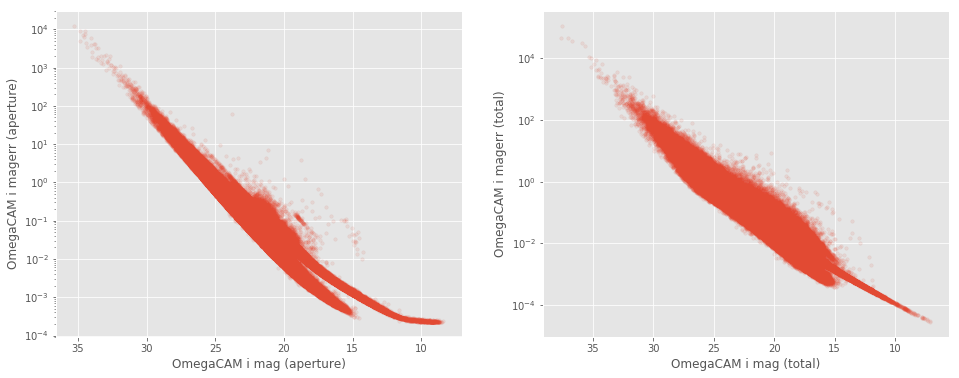

DECam i mag (aperture)
    Error max: 5050
    magerr > 10: Number of objects = 130, min mag = 27.2
    magerr > 100: Number of objects = 16, min mag = 29.8
    magerr > 1000: Number of objects = 5, min mag = 32.6

DECam i mag (total)
    Error max: 60975
    magerr > 10: Number of objects = 328, min mag = 25.6
    magerr > 100: Number of objects = 33, min mag = 29.1
    magerr > 1000: Number of objects = 6, min mag = 32.9



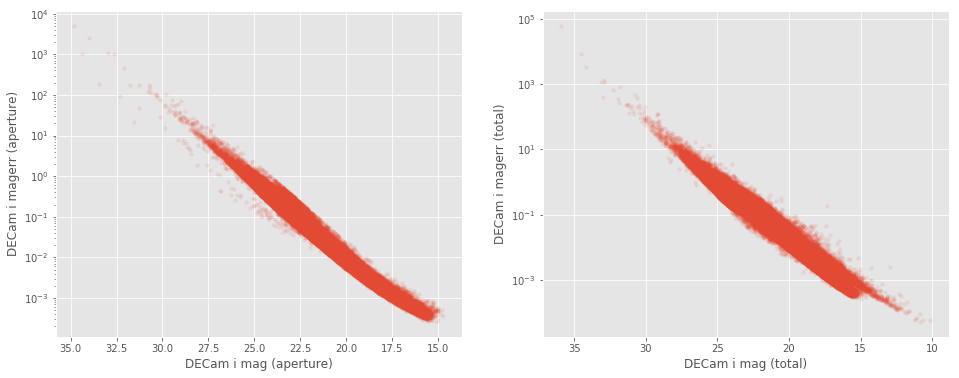

GPC1 i mag (aperture)
    Error max: 461
    magerr > 10: Number of objects = 157, min mag = 22.5
    magerr > 100: Number of objects = 8, min mag = 27.8
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 i mag (total)
    Error max: 1383
    magerr > 10: Number of objects = 209, min mag = 22.4
    magerr > 100: Number of objects = 23, min mag = 26.6
    magerr > 1000: Number of objects = 3, min mag = 27.6



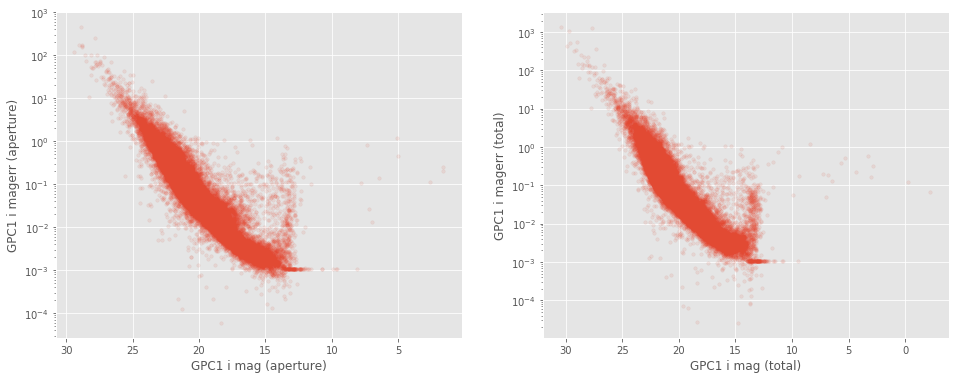

OmegaCAM z mag (aperture)
    Error max: 548
    magerr > 10: Number of objects = 54, min mag = 24.8
    magerr > 100: Number of objects = 7, min mag = 27.5
    magerr > 1000: Number of objects = 0, min mag = nan

OmegaCAM z mag (total)
    Error max: 1207
    magerr > 10: Number of objects = 52, min mag = 24.5
    magerr > 100: Number of objects = 5, min mag = 26.0
    magerr > 1000: Number of objects = 1, min mag = 28.4



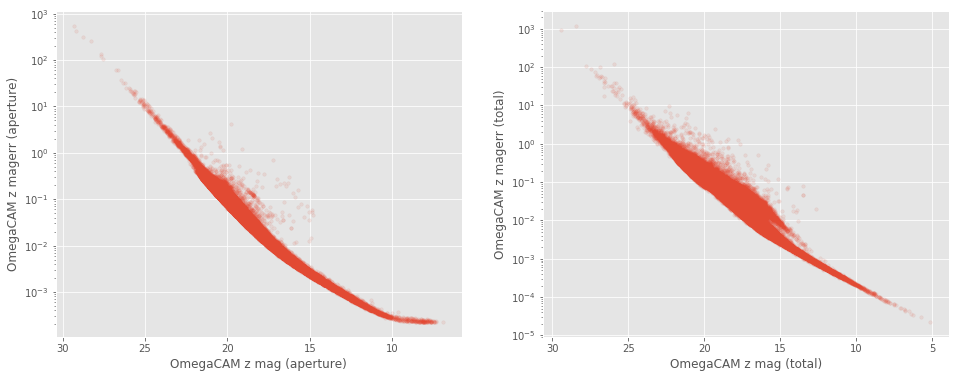

DECam z mag (aperture)
    Error max: 20766
    magerr > 10: Number of objects = 869, min mag = 26.4
    magerr > 100: Number of objects = 69, min mag = 28.8
    magerr > 1000: Number of objects = 6, min mag = 31.5

DECam z mag (total)
    Error max: 73348
    magerr > 10: Number of objects = 2536, min mag = 24.6
    magerr > 100: Number of objects = 202, min mag = 28.5
    magerr > 1000: Number of objects = 22, min mag = 31.4



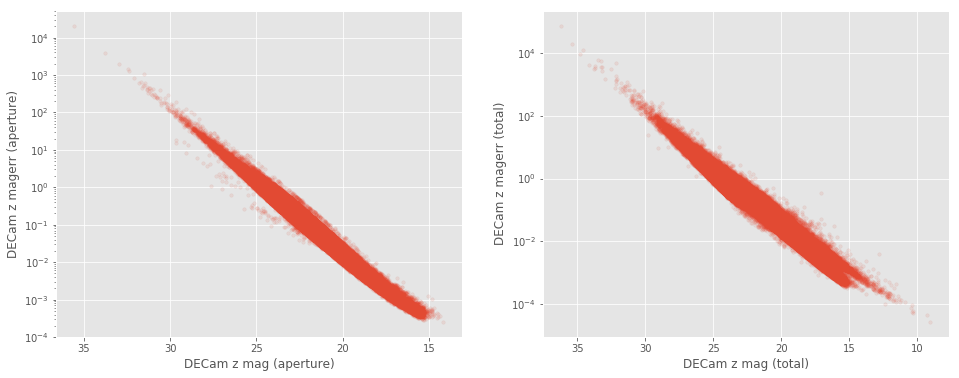

GPC1 z mag (aperture)
    Error max: 57507
    magerr > 10: Number of objects = 256, min mag = 12.3
    magerr > 100: Number of objects = 25, min mag = 12.3
    magerr > 1000: Number of objects = 6, min mag = 12.3

GPC1 z mag (total)
    Error max: 15328
    magerr > 10: Number of objects = 308, min mag = 5.0
    magerr > 100: Number of objects = 34, min mag = 11.7
    magerr > 1000: Number of objects = 3, min mag = 11.7



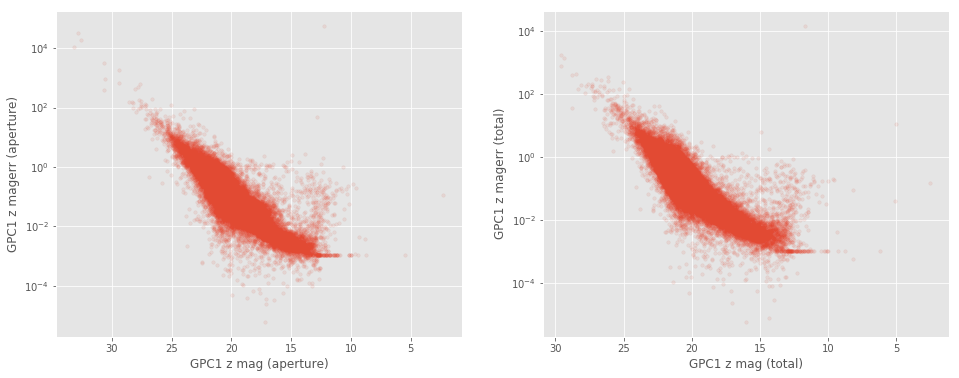

VISTA Z mag (aperture)
    Error max: 2364
    magerr > 10: Number of objects = 43, min mag = 22.4
    magerr > 100: Number of objects = 4, min mag = 24.1
    magerr > 1000: Number of objects = 1, min mag = 32.6

VISTA Z mag (total)
    Error max: 4906
    magerr > 10: Number of objects = 546, min mag = 21.0
    magerr > 100: Number of objects = 47, min mag = 24.2
    magerr > 1000: Number of objects = 4, min mag = 32.0



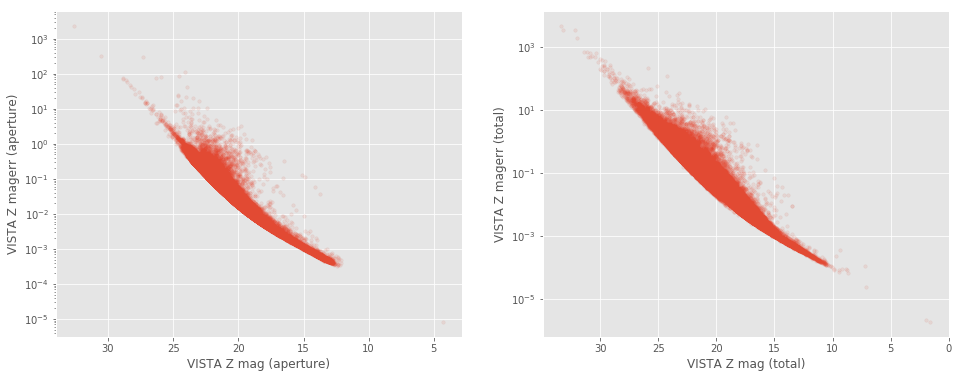

DECam y mag (aperture)
    Error max: 335805
    magerr > 10: Number of objects = 10350, min mag = 24.9
    magerr > 100: Number of objects = 990, min mag = 28.0
    magerr > 1000: Number of objects = 93, min mag = 30.7

DECam y mag (total)
    Error max: 70280
    magerr > 10: Number of objects = 16140, min mag = 24.1
    magerr > 100: Number of objects = 1585, min mag = 27.0
    magerr > 1000: Number of objects = 160, min mag = 29.8



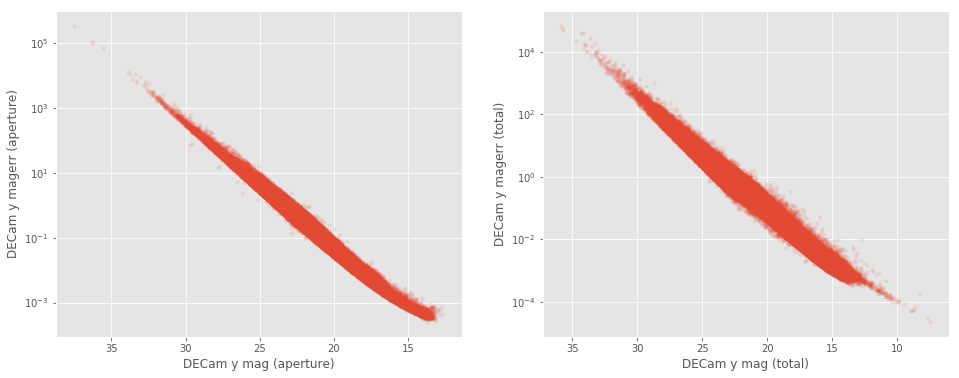

GPC1 y mag (aperture)
    Error max: 6648
    magerr > 10: Number of objects = 501, min mag = 12.2
    magerr > 100: Number of objects = 51, min mag = 25.4
    magerr > 1000: Number of objects = 7, min mag = 28.9

GPC1 y mag (total)
    Error max: 8225
    magerr > 10: Number of objects = 688, min mag = 11.3
    magerr > 100: Number of objects = 65, min mag = 24.2
    magerr > 1000: Number of objects = 8, min mag = 27.7



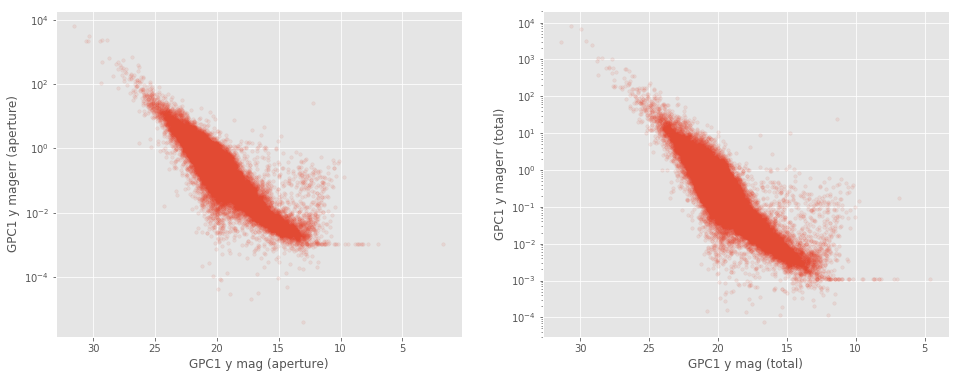

VISTA Y mag (aperture)
    Error max: 50
    magerr > 10: Number of objects = 11, min mag = 21.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA Y mag (total)
    Error max: 23894
    magerr > 10: Number of objects = 512, min mag = 18.0
    magerr > 100: Number of objects = 48, min mag = 25.8
    magerr > 1000: Number of objects = 4, min mag = 31.4



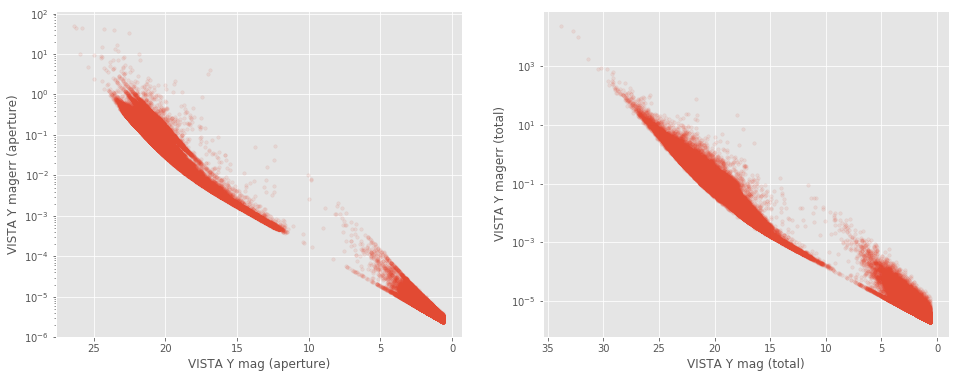

VISTA J mag (aperture)
    Error max: 130
    magerr > 10: Number of objects = 15, min mag = 22.0
    magerr > 100: Number of objects = 1, min mag = 25.4
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA J mag (total)
    Error max: 10817
    magerr > 10: Number of objects = 232, min mag = 20.7
    magerr > 100: Number of objects = 15, min mag = 27.5
    magerr > 1000: Number of objects = 3, min mag = 31.1



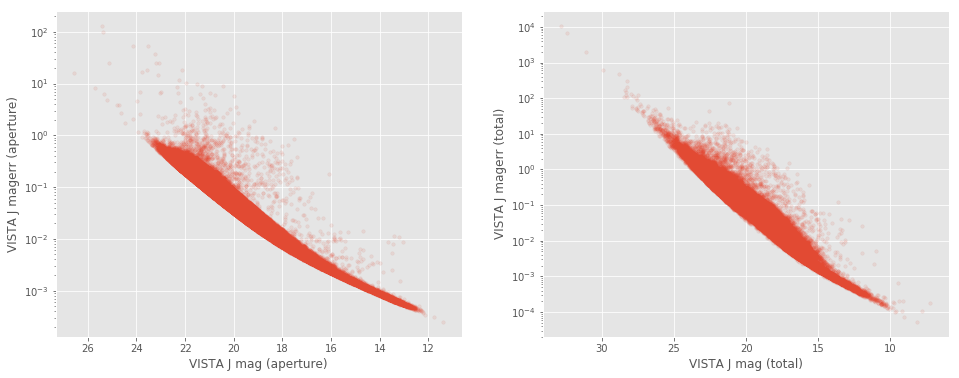

VISTA H mag (aperture)
    Error max: 1341
    magerr > 10: Number of objects = 53, min mag = 22.1
    magerr > 100: Number of objects = 6, min mag = 26.6
    magerr > 1000: Number of objects = 1, min mag = 26.6

VISTA H mag (total)
    Error max: 4104
    magerr > 10: Number of objects = 348, min mag = 20.6
    magerr > 100: Number of objects = 35, min mag = 26.5
    magerr > 1000: Number of objects = 2, min mag = 29.8



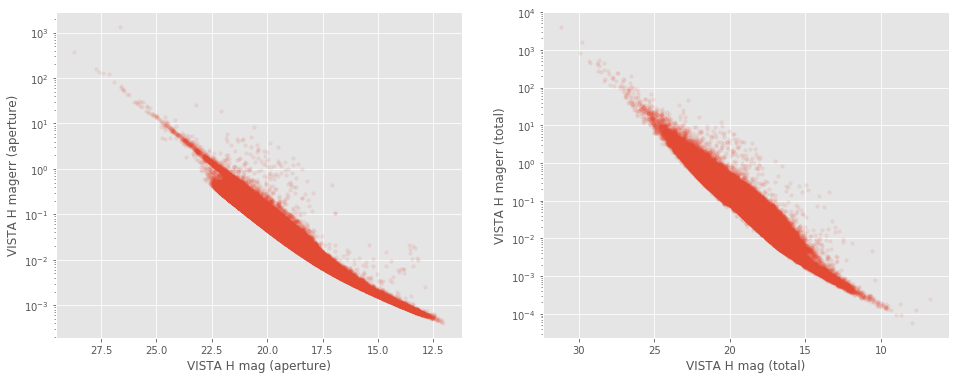

VISTA Ks mag (aperture)
    Error max: 99
    magerr > 10: Number of objects = 3, min mag = 21.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA Ks mag (total)
    Error max: 487
    magerr > 10: Number of objects = 146, min mag = 20.5
    magerr > 100: Number of objects = 13, min mag = 27.0
    magerr > 1000: Number of objects = 0, min mag = nan



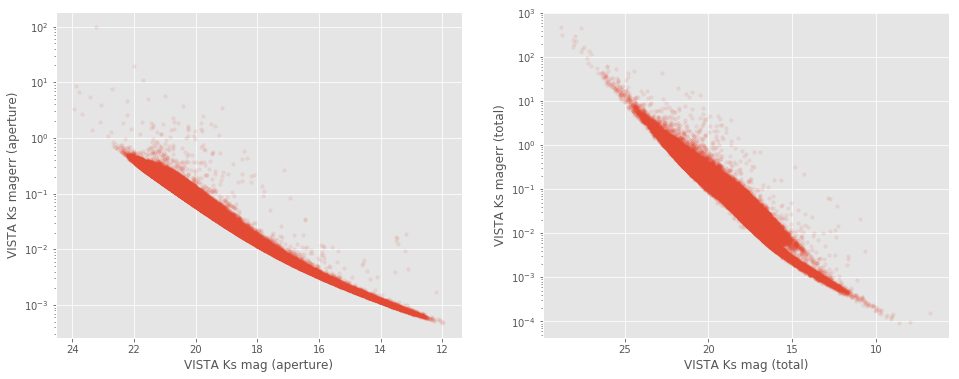

In [45]:
for mag in all_mags:

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "omegacam_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [46]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             irac=False, savefig=False):

    if nb == 1 and not irac:
        fig, (ax1) = plt.subplots(ncols=1, figsize=(6, 6))
    elif nb == 2 or (nb == 1 and irac and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    elif nb > 2 or (nb == 1 and x3 is not None):
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    if nb == 1 and irac:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y3[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        elif "WIRCS" in labels1[0]:
            figname = field + "_wircsIssues.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 72


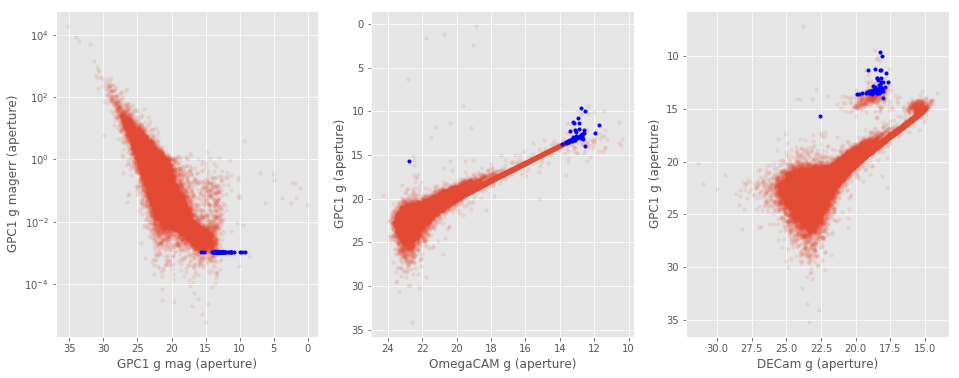

GPC1 r
   Number of flagged objects: 95


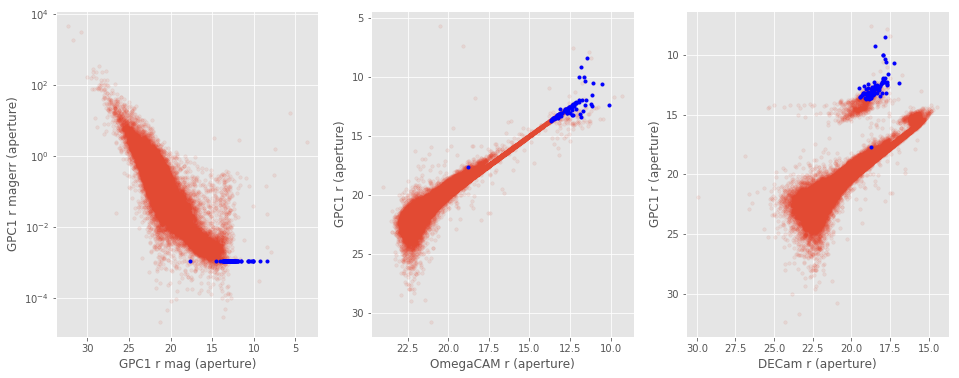

GPC1 i
   Number of flagged objects: 101


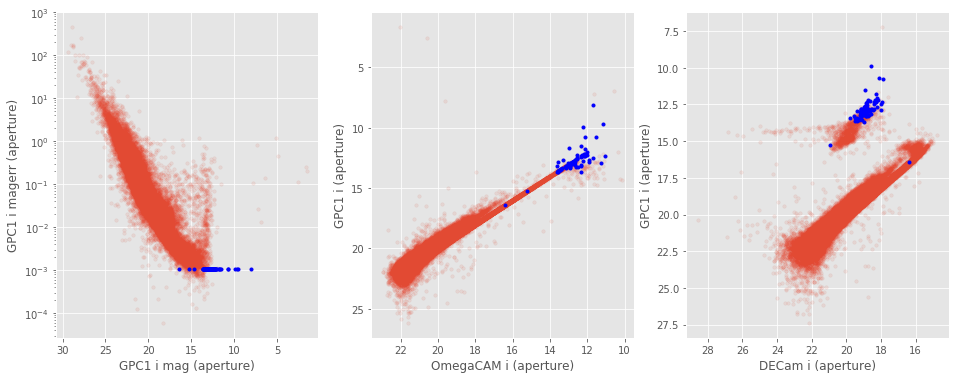

GPC1 z
   Number of flagged objects: 95


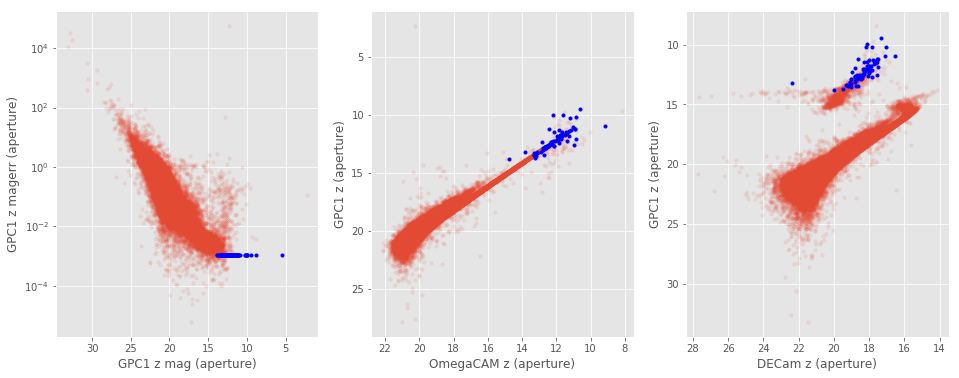

GPC1 y
   Number of flagged objects: 38


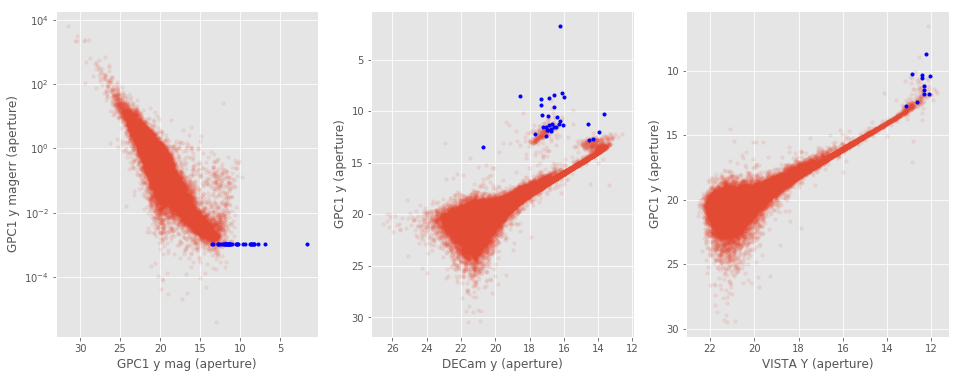

In [48]:
# PanSTARRS forced photometry catalogue
ps1_err = 0.0010860000038519502
# PanSTARRS stack catalogue
# ps1_err = 0.05000000074505806

bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    if len(surveys) == 1:
        basecol1 = surveys[0].replace(" ", "_").lower()
        col1 = "m_ap_{}".format(basecol1)
        x2, labels2 = None, None
    else:
        basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        x2 = master_catalogue[col2]
        labels2 = ("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0]))
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_z':
        savefig = True
    else:
        savefig = False

    
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    x2, master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=labels2,
                    labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 4.7\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [49]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr) #& (x!=0) & (y!=0) & (x<95) & (y<95)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

OmegaCAM g (aperture) - GPC1 g (aperture) (52101 sources):
- Median: 0.31
- Median Absolute Deviation: 0.30
- 1% percentile: -1.9113541394042954
- 99% percentile: 1.6992722563476548
Outliers separation: log(chi2) = 7.04
Number of outliers: 0



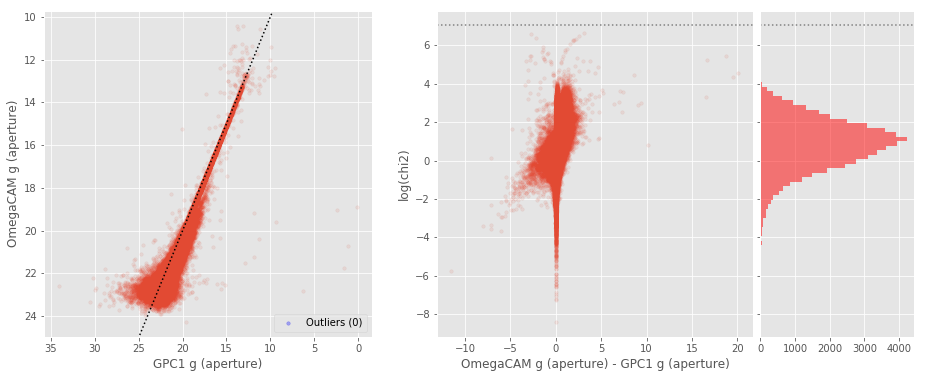

OmegaCAM g (total) - GPC1 g (total) (52594 sources):
- Median: 0.05
- Median Absolute Deviation: 0.21
- 1% percentile: -1.4935603986975086
- 99% percentile: 1.6993331028759753
Outliers separation: log(chi2) = 5.13
Number of outliers: 39



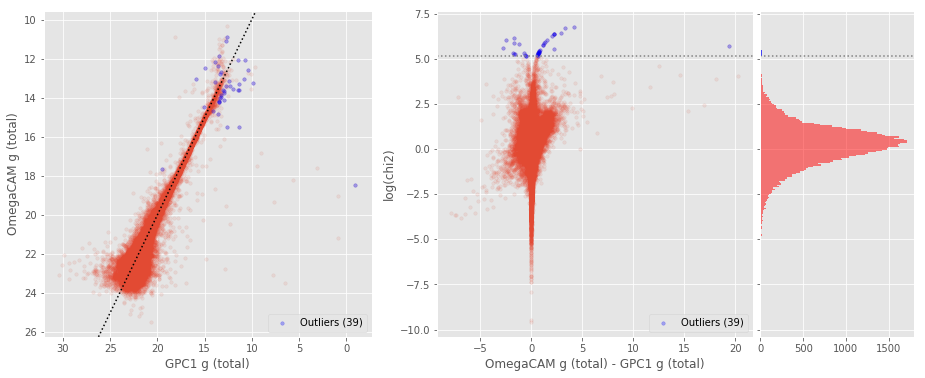

DECam g (aperture) - GPC1 g (aperture) (87658 sources):
- Median: 0.34
- Median Absolute Deviation: 0.42
- 1% percentile: -2.285382919311523
- 99% percentile: 3.439809837341298
Outliers separation: log(chi2) = 6.85
Number of outliers: 15



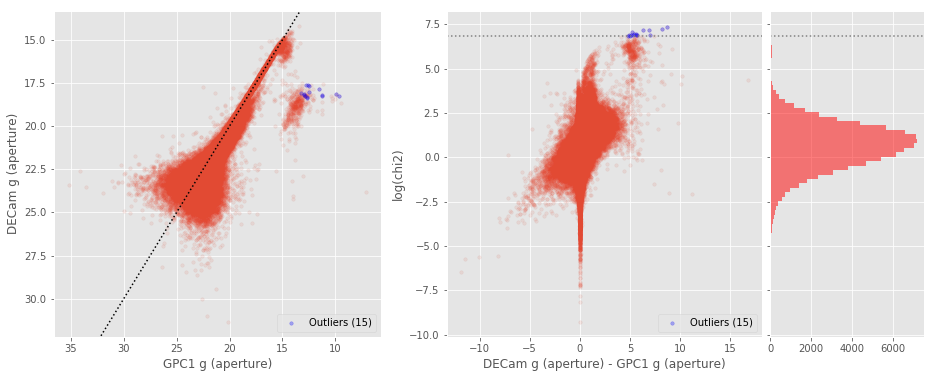

DECam g (total) - GPC1 g (total) (88440 sources):
- Median: 0.01
- Median Absolute Deviation: 0.27
- 1% percentile: -1.8424998855590822
- 99% percentile: 3.1633839988708505
Outliers separation: log(chi2) = 5.27
Number of outliers: 282



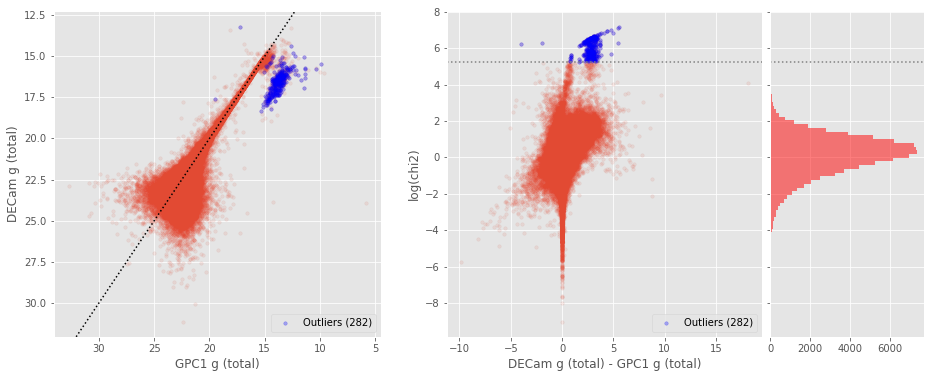

DECam g (aperture) - OmegaCAM g (aperture) (143826 sources):
- Median: -0.13
- Median Absolute Deviation: 0.09
- 1% percentile: -0.6553557628784175
- 99% percentile: 2.0730971601562507
Outliers separation: log(chi2) = 5.59
Number of outliers: 1404



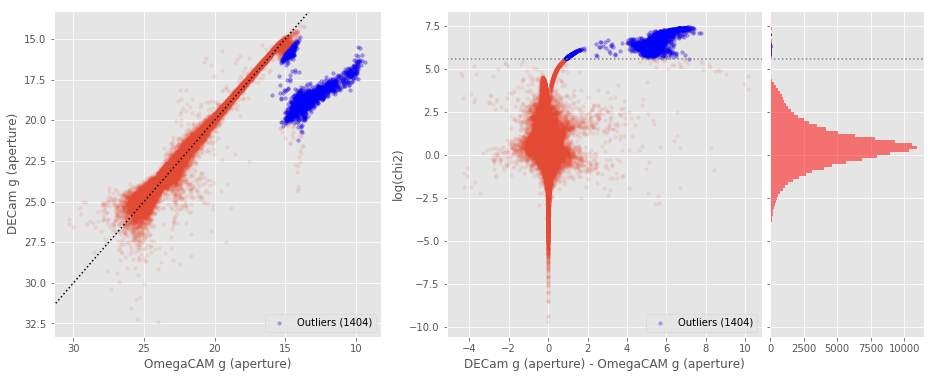

DECam g (total) - OmegaCAM g (total) (143768 sources):
- Median: -0.09
- Median Absolute Deviation: 0.14
- 1% percentile: -1.1914149525219733
- 99% percentile: 2.012463820451596
Outliers separation: log(chi2) = 4.91
Number of outliers: 1584



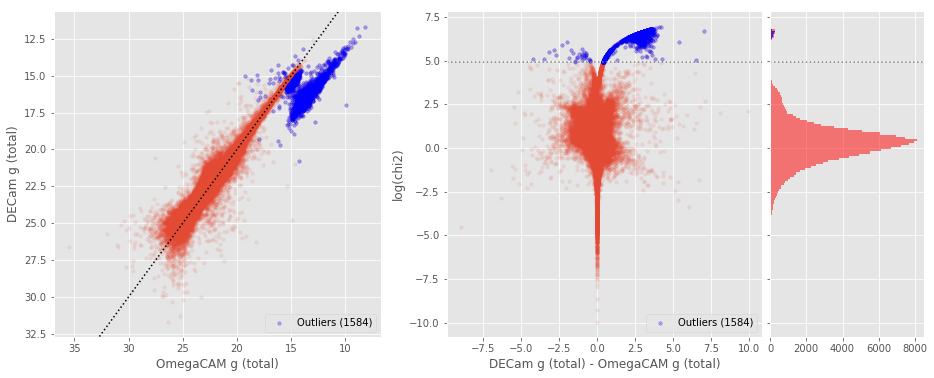

OmegaCAM r (aperture) - GPC1 r (aperture) (80124 sources):
- Median: 0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -1.3826663974511713
- 99% percentile: 1.2062200648828125
Outliers separation: log(chi2) = 5.92
Number of outliers: 14



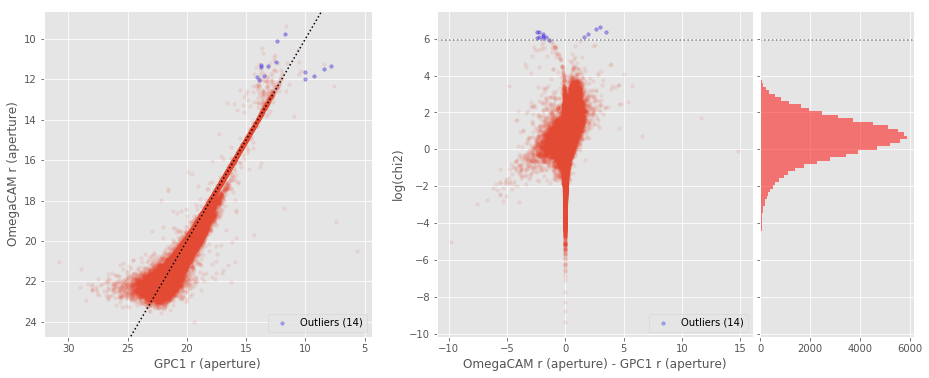

OmegaCAM r (total) - GPC1 r (total) (80323 sources):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.256448257790528
- 99% percentile: 1.235192886350099
Outliers separation: log(chi2) = 5.16
Number of outliers: 44



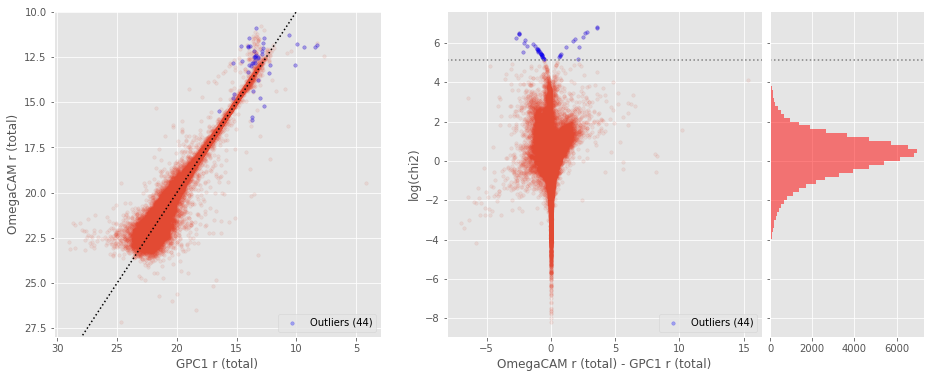

DECam r (aperture) - GPC1 r (aperture) (94537 sources):
- Median: 0.09
- Median Absolute Deviation: 0.29
- 1% percentile: -1.7544319152832029
- 99% percentile: 2.871636428833
Outliers separation: log(chi2) = 6.72
Number of outliers: 64



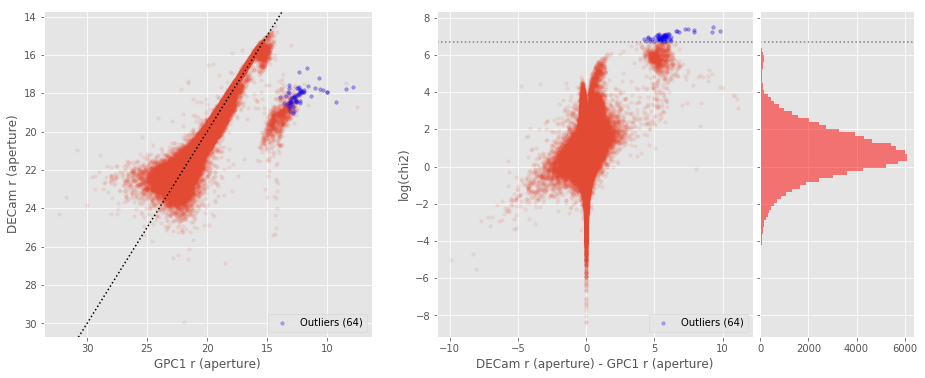

DECam r (total) - GPC1 r (total) (94775 sources):
- Median: -0.18
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4435052871704102
- 99% percentile: 2.3794325447082474
Outliers separation: log(chi2) = 5.63
Number of outliers: 400



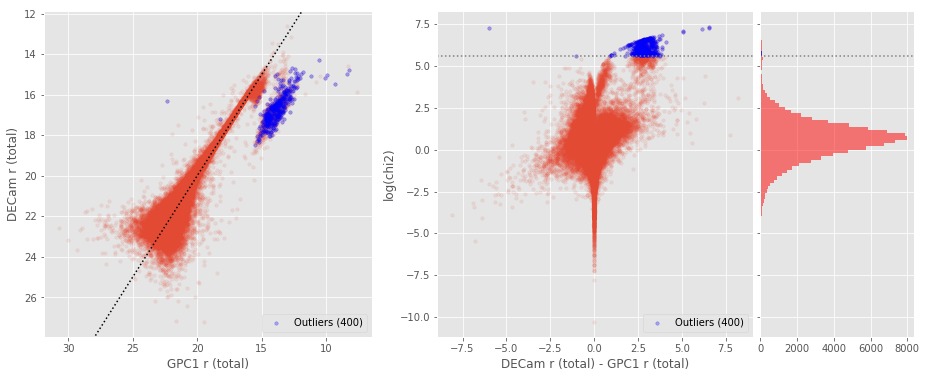

DECam r (aperture) - OmegaCAM r (aperture) (198889 sources):
- Median: -0.13
- Median Absolute Deviation: 0.08
- 1% percentile: -0.5313685607910157
- 99% percentile: 4.90415089031738
Outliers separation: log(chi2) = 5.36
Number of outliers: 2547



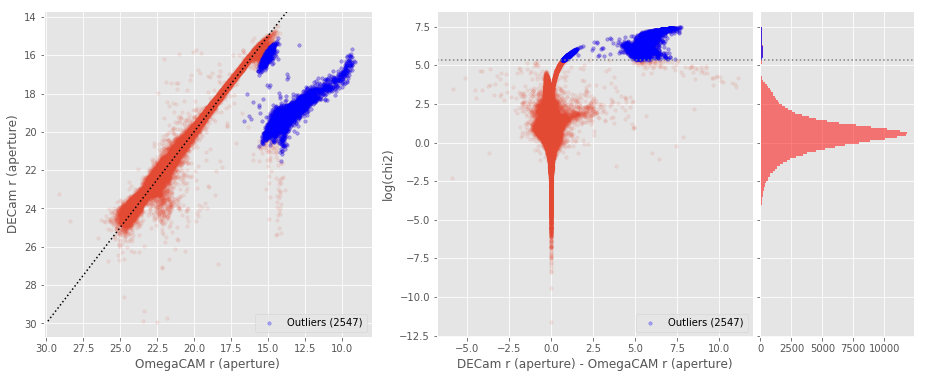

DECam r (total) - OmegaCAM r (total) (198949 sources):
- Median: -0.11
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0392795079199229
- 99% percentile: 2.6303978898632634
Outliers separation: log(chi2) = 4.74
Number of outliers: 2909



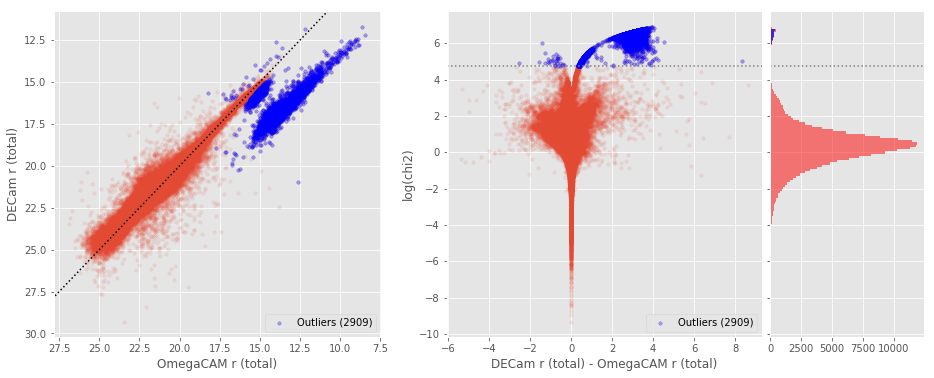

OmegaCAM i (aperture) - GPC1 i (aperture) (83492 sources):
- Median: 0.19
- Median Absolute Deviation: 0.20
- 1% percentile: -0.6880863328930661
- 99% percentile: 1.0542529474218758
Outliers separation: log(chi2) = 5.99
Number of outliers: 8



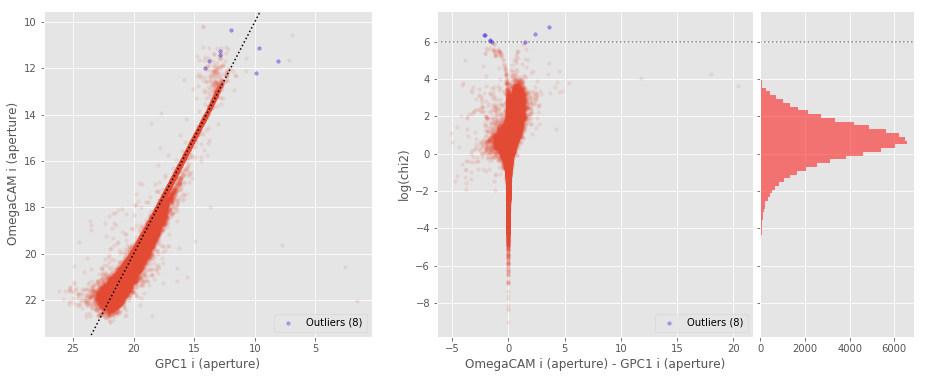

OmegaCAM i (total) - GPC1 i (total) (83569 sources):
- Median: -0.06
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8278019711059568
- 99% percentile: 0.8748916722021478
Outliers separation: log(chi2) = 4.79
Number of outliers: 45



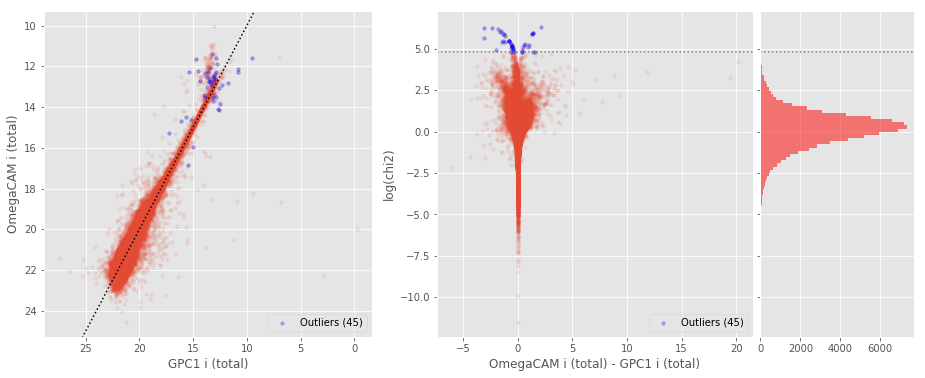

DECam i (aperture) - GPC1 i (aperture) (99092 sources):
- Median: 0.12
- Median Absolute Deviation: 0.24
- 1% percentile: -0.887042579650879
- 99% percentile: 5.165577220916746
Outliers separation: log(chi2) = 7.04
Number of outliers: 4



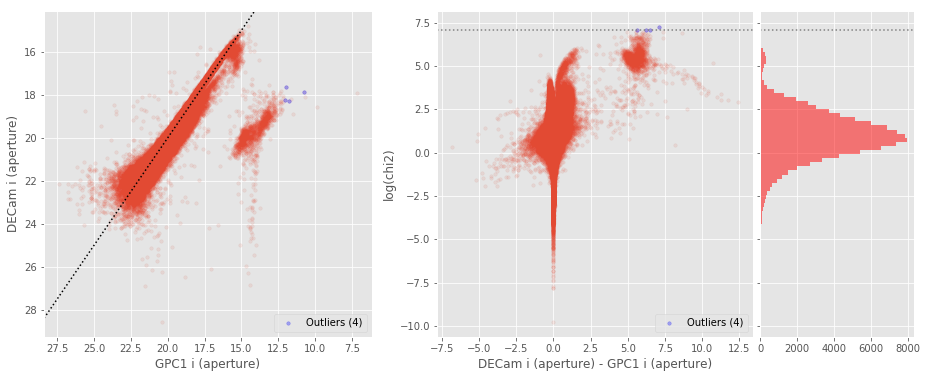

DECam i (total) - GPC1 i (total) (99232 sources):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7886438179016113
- 99% percentile: 2.859570207595828
Outliers separation: log(chi2) = 5.22
Number of outliers: 1006



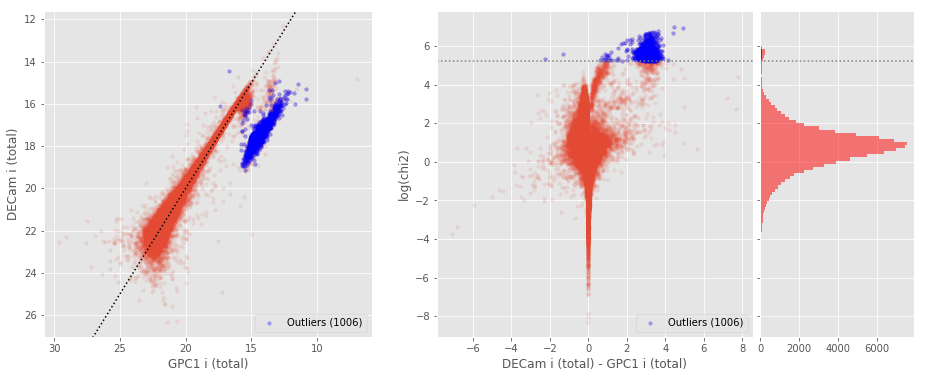

DECam i (aperture) - OmegaCAM i (aperture) (184610 sources):
- Median: -0.10
- Median Absolute Deviation: 0.09
- 1% percentile: -0.6320021203759779
- 99% percentile: 5.629409165587158
Outliers separation: log(chi2) = 5.18
Number of outliers: 2912



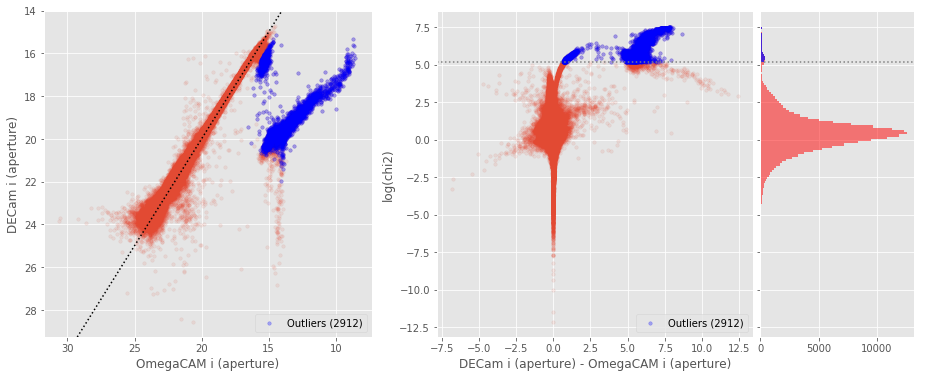

DECam i (total) - OmegaCAM i (total) (184760 sources):
- Median: -0.13
- Median Absolute Deviation: 0.15
- 1% percentile: -1.150926598312989
- 99% percentile: 3.180622922191162
Outliers separation: log(chi2) = 4.72
Number of outliers: 3597



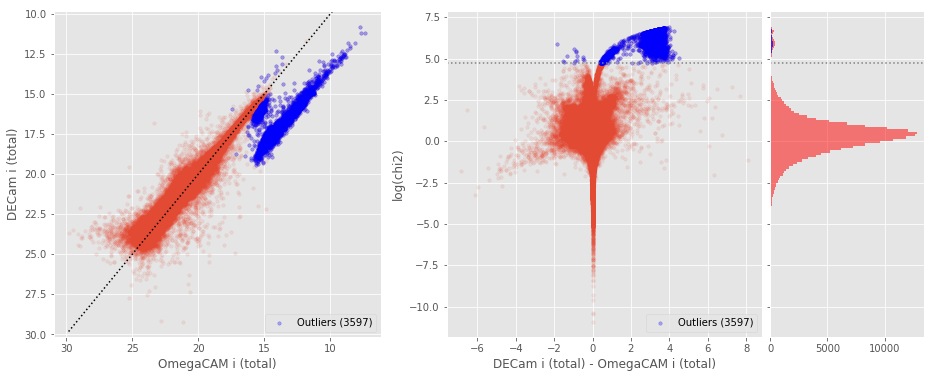

OmegaCAM z (aperture) - GPC1 z (aperture) (48008 sources):
- Median: -0.00
- Median Absolute Deviation: 0.19
- 1% percentile: -1.0216122585314946
- 99% percentile: 0.9912613233752442
Outliers separation: log(chi2) = 6.23
Number of outliers: 1



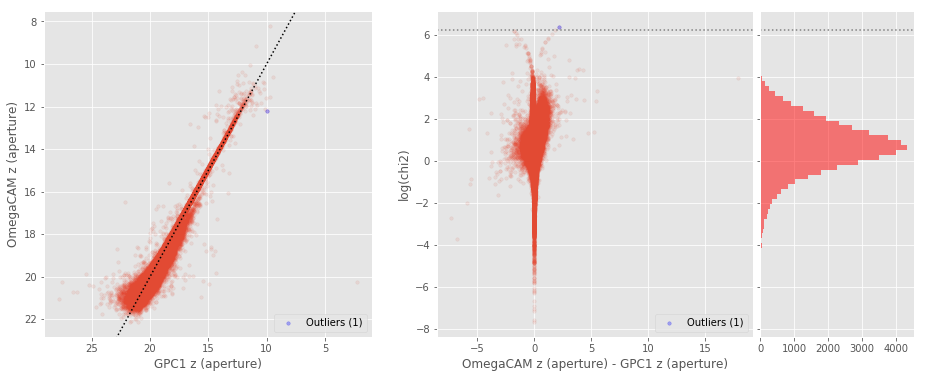

OmegaCAM z (total) - GPC1 z (total) (48219 sources):
- Median: -0.17
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9812702810717786
- 99% percentile: 0.826616867524413
Outliers separation: log(chi2) = 5.66
Number of outliers: 15



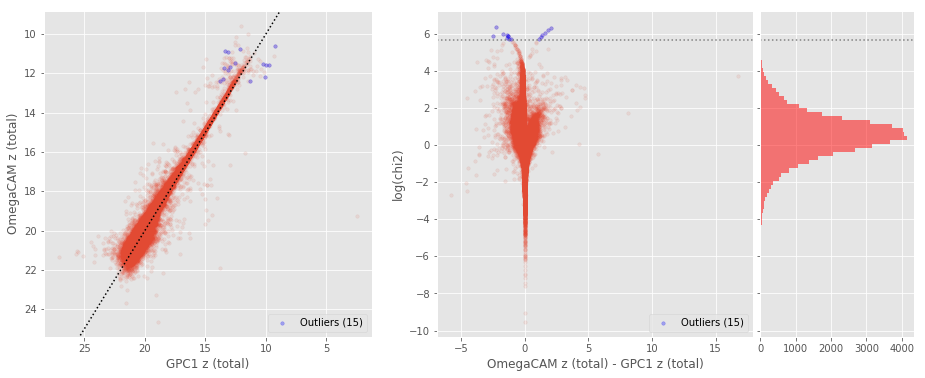

DECam z (aperture) - GPC1 z (aperture) (94191 sources):
- Median: 0.15
- Median Absolute Deviation: 0.27
- 1% percentile: -1.5704231262207031
- 99% percentile: 5.244459342956548
Outliers separation: log(chi2) = 6.52
Number of outliers: 59



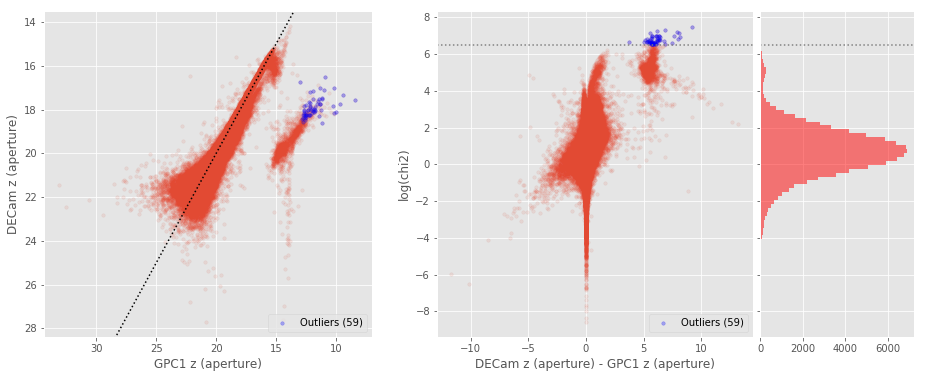

DECam z (total) - GPC1 z (total) (94636 sources):
- Median: -0.17
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3152912139892579
- 99% percentile: 2.861133384704588
Outliers separation: log(chi2) = 5.51
Number of outliers: 406



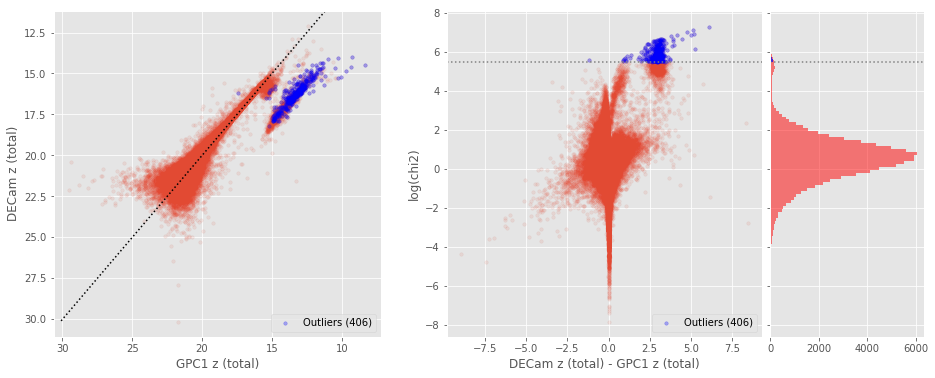

VISTA Z (aperture) - GPC1 z (aperture) (54266 sources):
- Median: 0.14
- Median Absolute Deviation: 0.24
- 1% percentile: -1.5699371337890626
- 99% percentile: 1.2869013786315864
Outliers separation: log(chi2) = 6.23
Number of outliers: 13



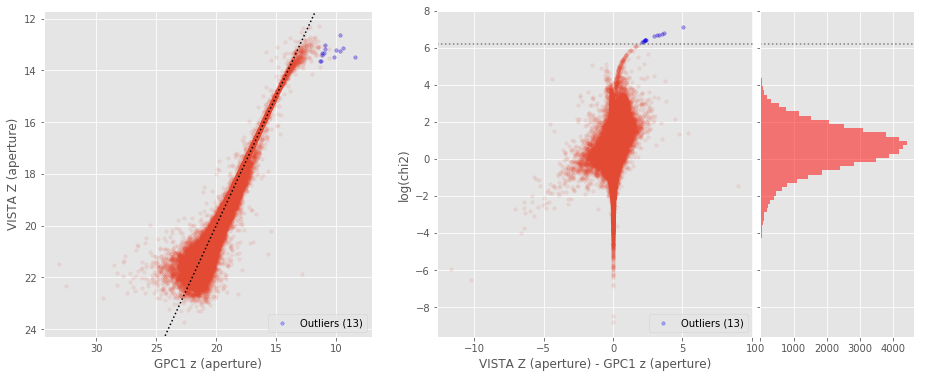

VISTA Z (total) - GPC1 z (total) (54506 sources):
- Median: -0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -1.5668813705444335
- 99% percentile: 1.383241176605224
Outliers separation: log(chi2) = 5.59
Number of outliers: 17



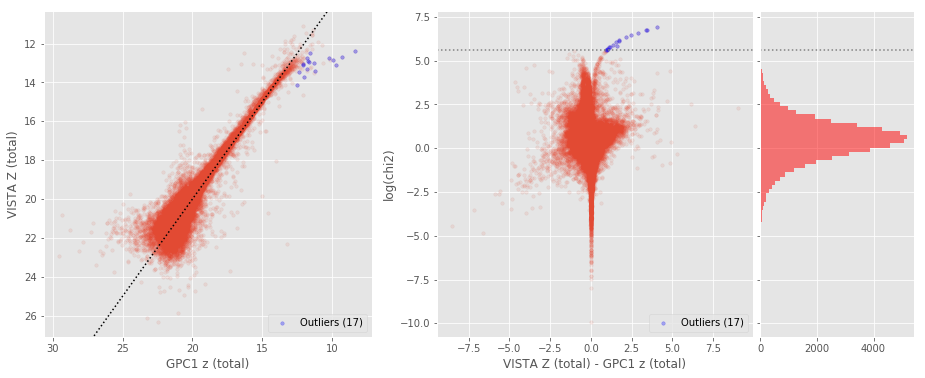

DECam z (aperture) - OmegaCAM z (aperture) (98279 sources):
- Median: 0.04
- Median Absolute Deviation: 0.08
- 1% percentile: -0.32885169390136615
- 99% percentile: 6.077622218408205
Outliers separation: log(chi2) = 4.96
Number of outliers: 2765



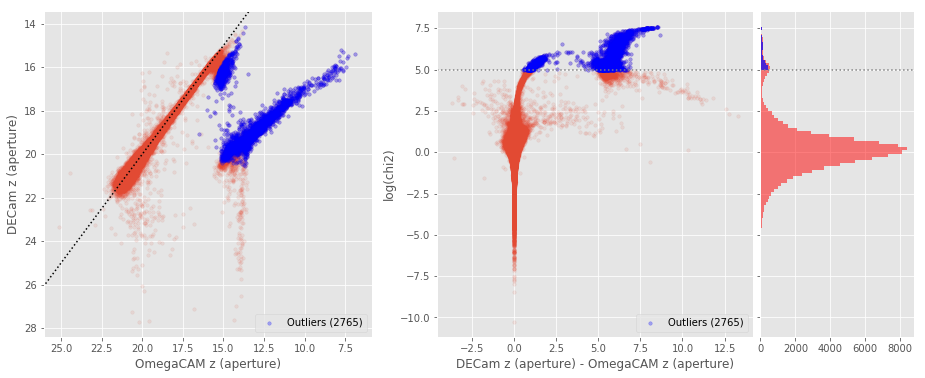

DECam z (total) - OmegaCAM z (total) (98332 sources):
- Median: 0.00
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8643496680932631
- 99% percentile: 3.351463608386841
Outliers separation: log(chi2) = 4.83
Number of outliers: 3341



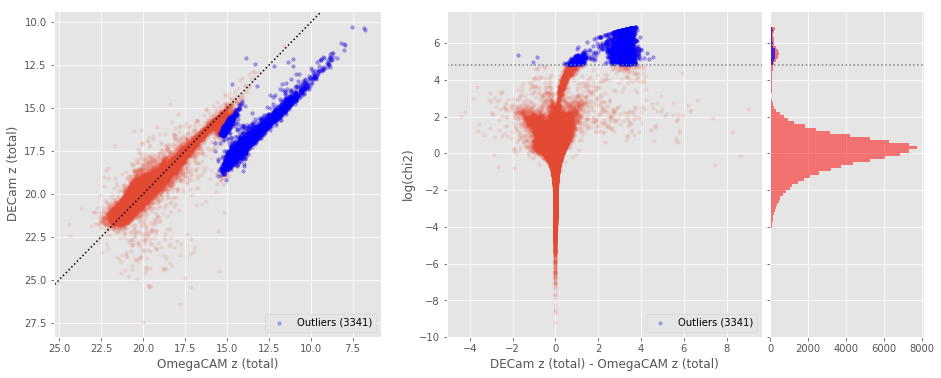

VISTA Z (aperture) - OmegaCAM z (aperture) (113616 sources):
- Median: 0.06
- Median Absolute Deviation: 0.06
- 1% percentile: -0.31287999179077153
- 99% percentile: 0.8878818496307441
Outliers separation: log(chi2) = 5.37
Number of outliers: 947



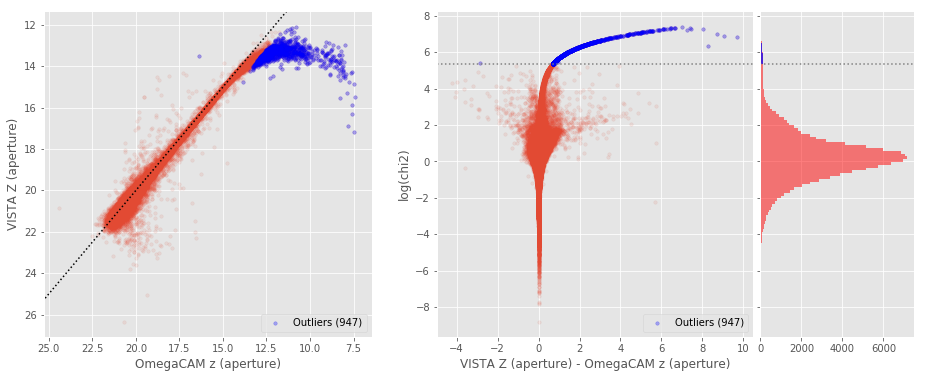

VISTA Z (total) - OmegaCAM z (total) (113625 sources):
- Median: 0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -0.942190759228514
- 99% percentile: 1.1953843182372972
Outliers separation: log(chi2) = 5.24
Number of outliers: 756



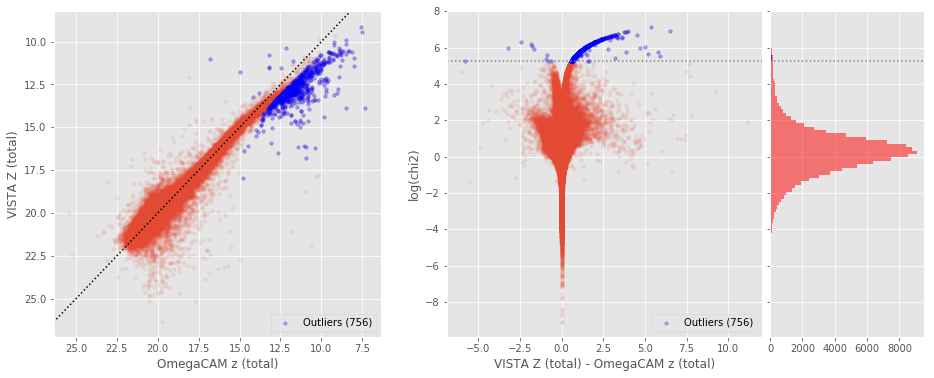

VISTA Z (aperture) - DECam z (aperture) (292317 sources):
- Median: 0.02
- Median Absolute Deviation: 0.10
- 1% percentile: -1.0469912338256837
- 99% percentile: 0.5172682952880888
Outliers separation: log(chi2) = 4.31
Number of outliers: 2289



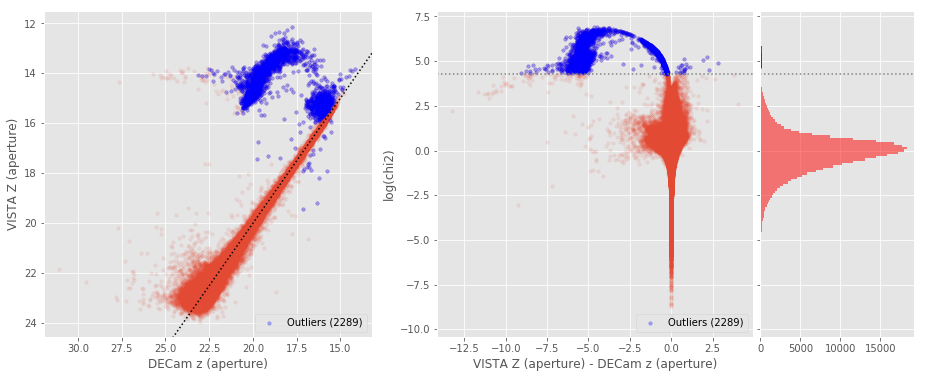

VISTA Z (total) - DECam z (total) (292126 sources):
- Median: 0.02
- Median Absolute Deviation: 0.20
- 1% percentile: -1.8352208137512207
- 99% percentile: 1.2586159706115723
Outliers separation: log(chi2) = 4.07
Number of outliers: 2626



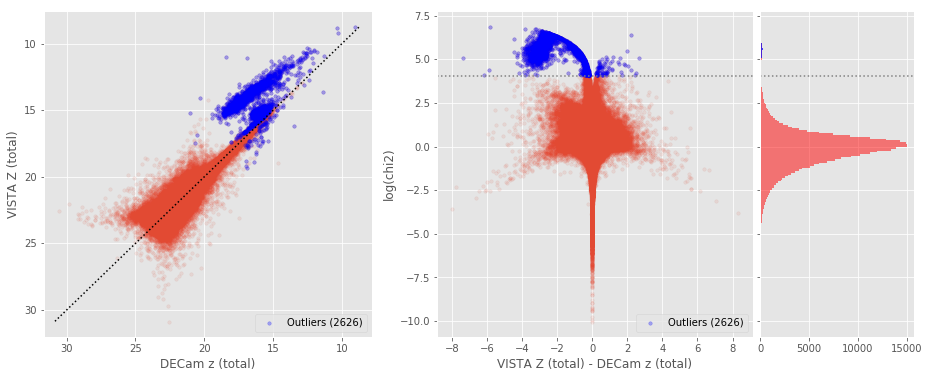

DECam y (aperture) - GPC1 y (aperture) (90071 sources):
- Median: 0.38
- Median Absolute Deviation: 0.38
- 1% percentile: -1.9313240051269531
- 99% percentile: 2.6240081787109393
Outliers separation: log(chi2) = 6.12
Number of outliers: 45



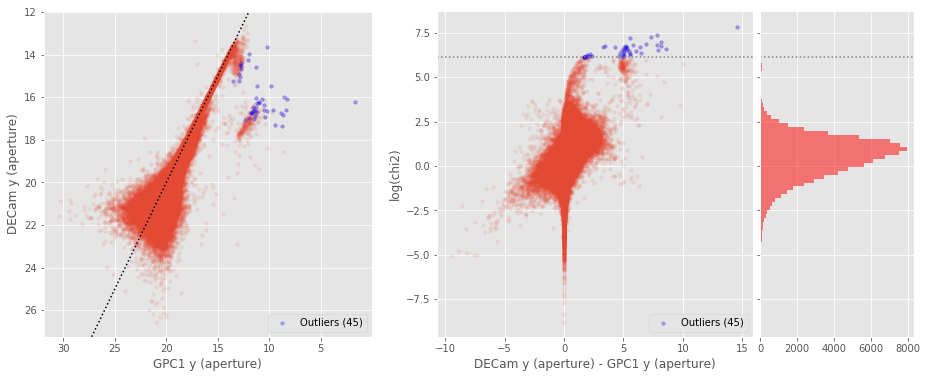

DECam y (total) - GPC1 y (total) (89900 sources):
- Median: -0.01
- Median Absolute Deviation: 0.32
- 1% percentile: -1.8586330223083496
- 99% percentile: 2.707396850585933
Outliers separation: log(chi2) = 5.32
Number of outliers: 128



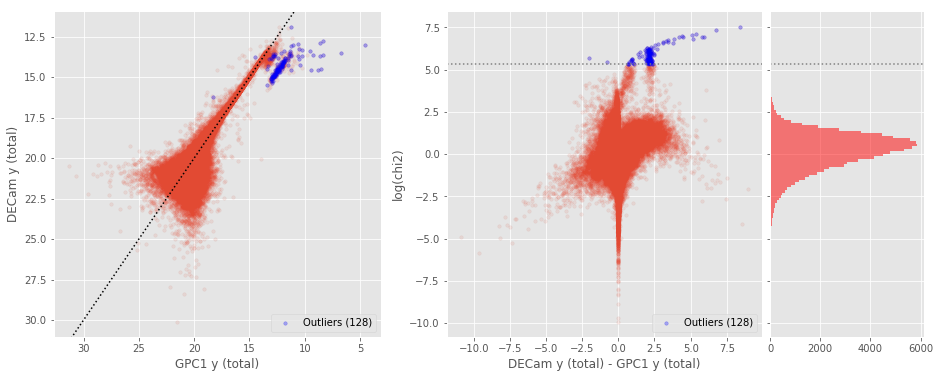

VISTA Y (aperture) - GPC1 y (aperture) (50277 sources):
- Median: 0.23
- Median Absolute Deviation: 0.35
- 1% percentile: -2.0794493103027345
- 99% percentile: 2.0559496307373024
Outliers separation: log(chi2) = 6.12
Number of outliers: 8



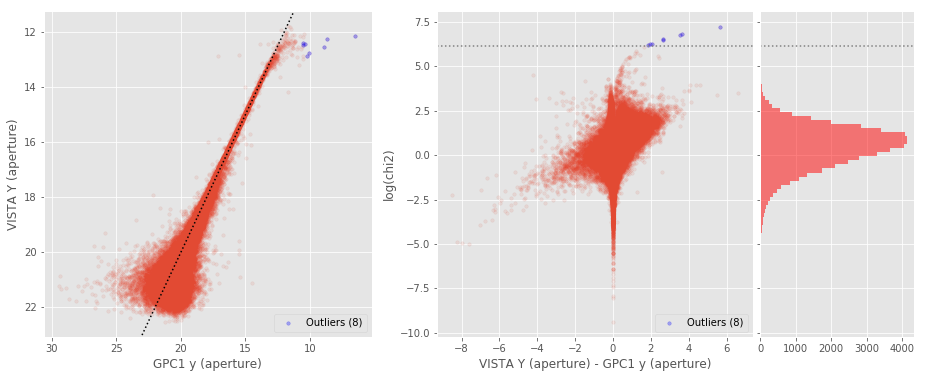

VISTA Y (total) - GPC1 y (total) (50270 sources):
- Median: -0.13
- Median Absolute Deviation: 0.33
- 1% percentile: -2.0732569122314453
- 99% percentile: 2.296523513793944
Outliers separation: log(chi2) = 5.65
Number of outliers: 9



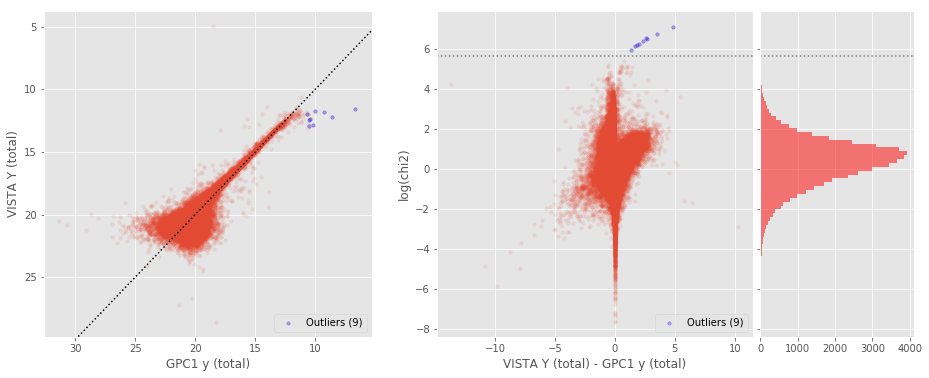

VISTA Y (aperture) - DECam y (aperture) (182185 sources):
- Median: -0.13
- Median Absolute Deviation: 0.11
- 1% percentile: -1.254634780883789
- 99% percentile: 0.40849525451660174
Outliers separation: log(chi2) = 4.45
Number of outliers: 742



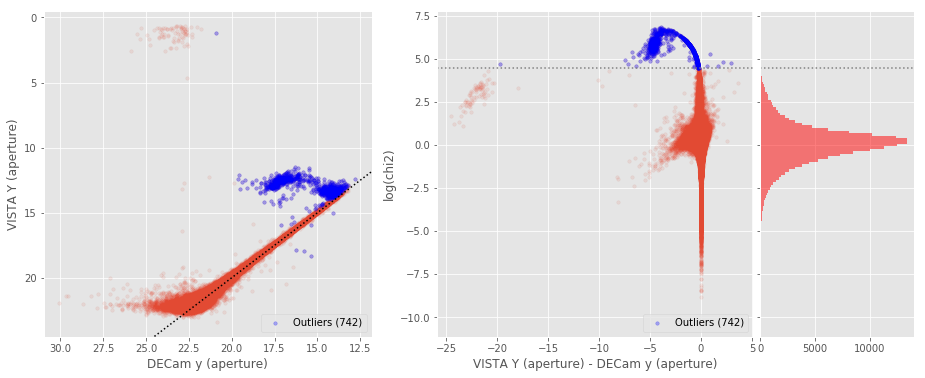

VISTA Y (total) - DECam y (total) (181282 sources):
- Median: -0.12
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9102586364746093
- 99% percentile: 1.1940482139587405
Outliers separation: log(chi2) = 4.41
Number of outliers: 769



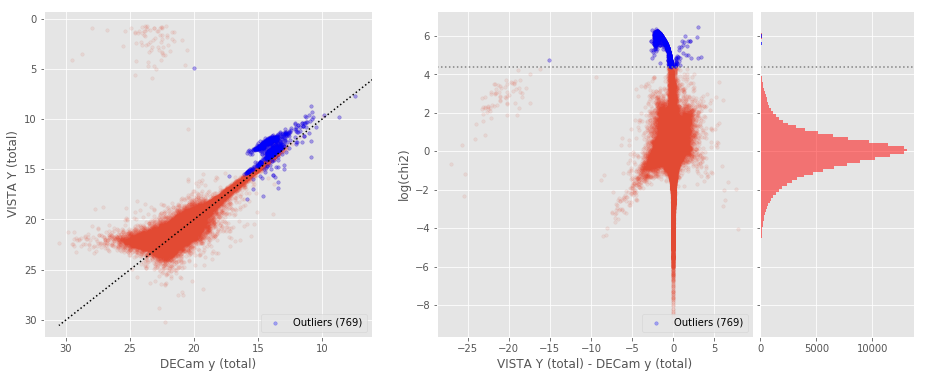

In [51]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_r" and basecol2 == "decam_r":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)), savefig=savefig)
        
for j in range(40):
    plt.close() 

## 4/ Aperture correction issues

In [52]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity) #& (x!=0) & (y!=0) & (x<95) & (y<95)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

OmegaCAM g (aperture) - GPC1 g (aperture):


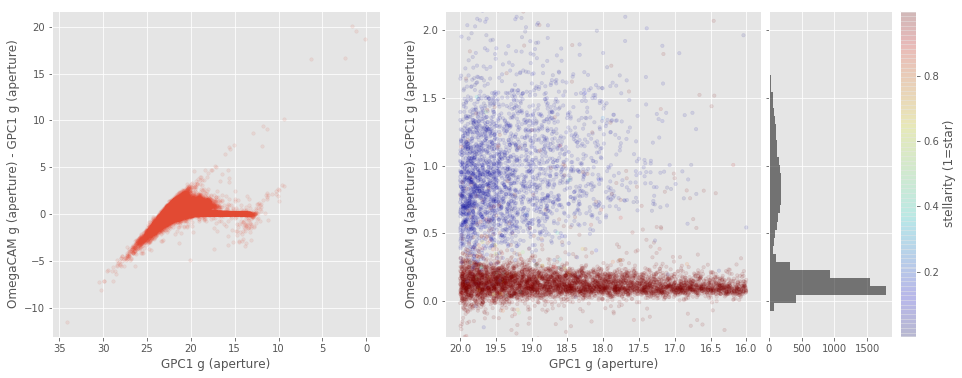

DECam g (aperture) - GPC1 g (aperture):


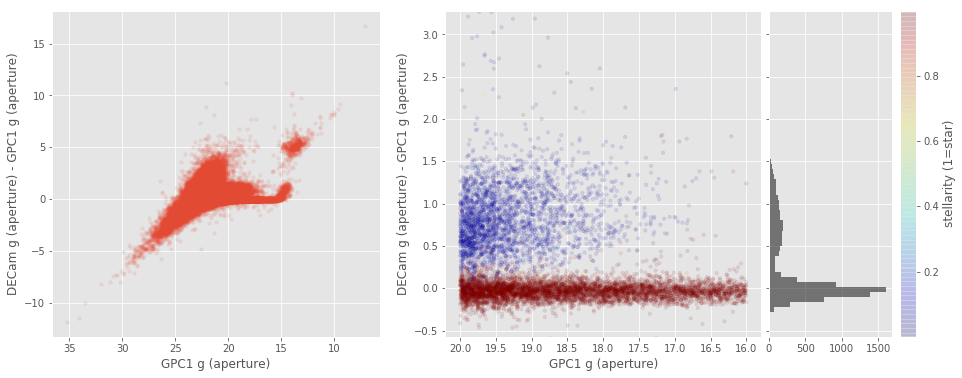

DECam g (aperture) - OmegaCAM g (aperture):


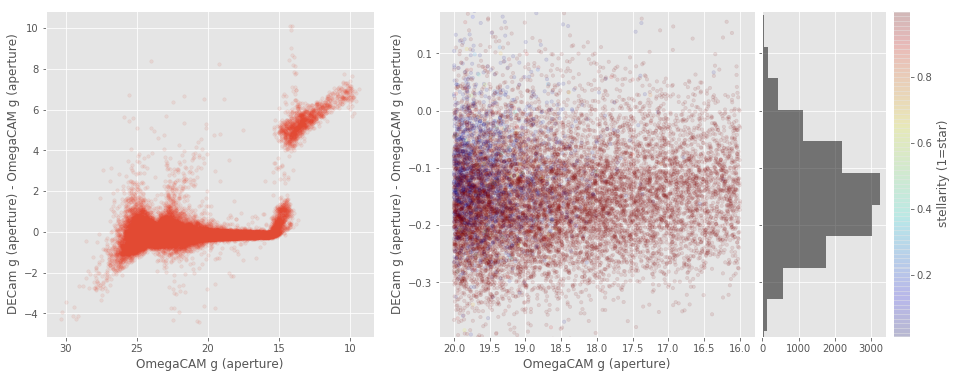

OmegaCAM r (aperture) - GPC1 r (aperture):


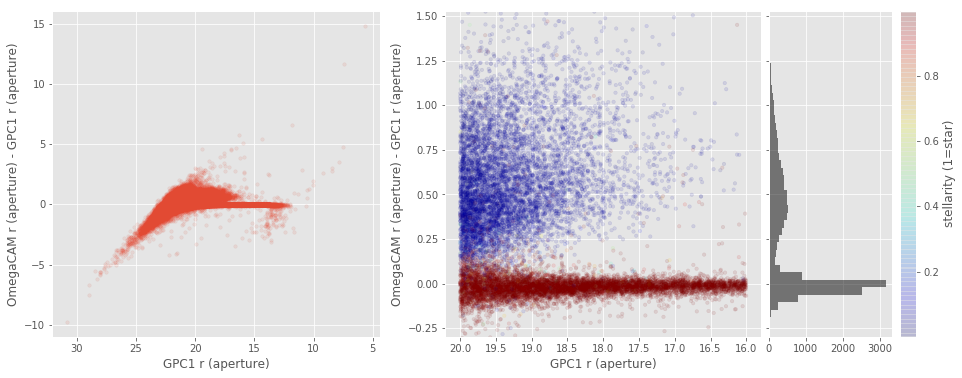

DECam r (aperture) - GPC1 r (aperture):


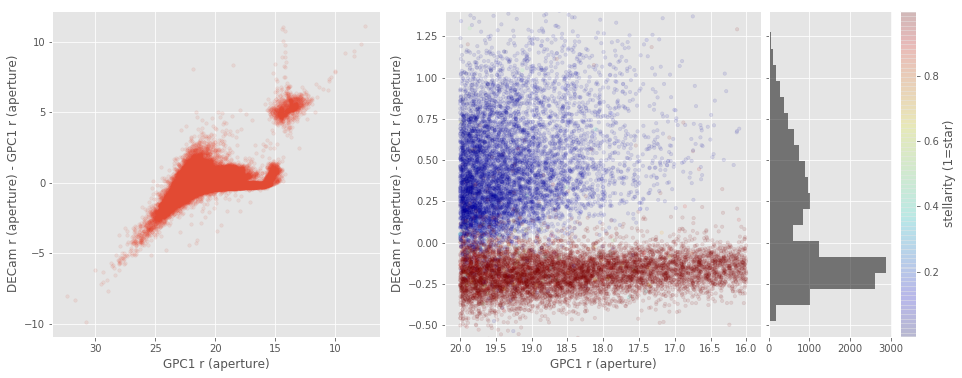

DECam r (aperture) - OmegaCAM r (aperture):


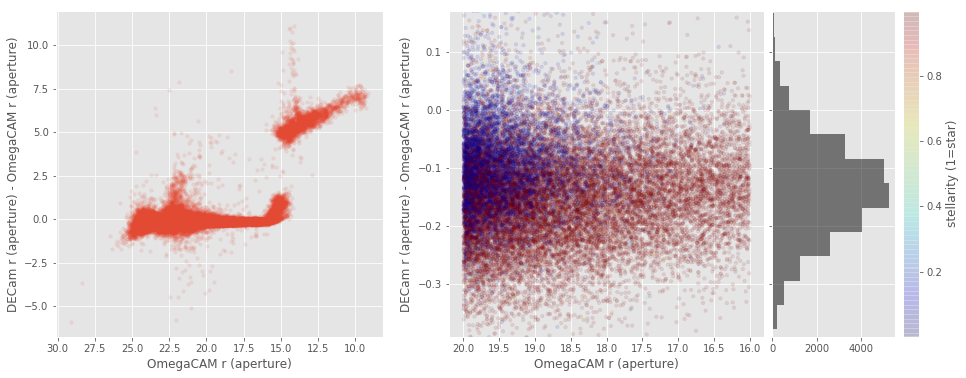

OmegaCAM i (aperture) - GPC1 i (aperture):


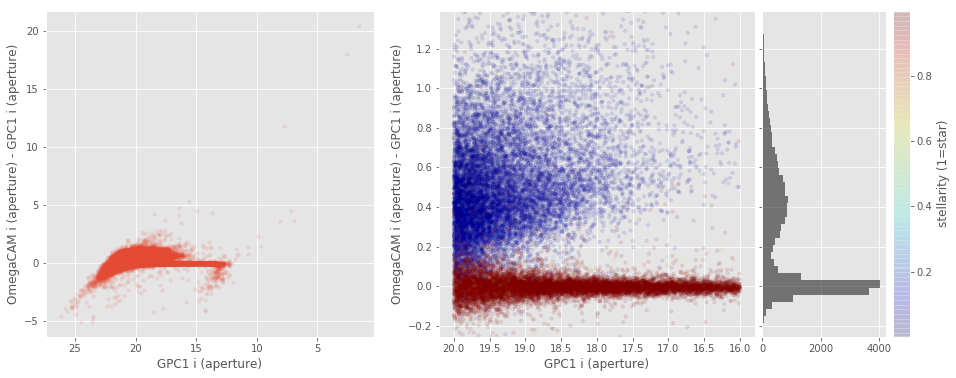

DECam i (aperture) - GPC1 i (aperture):


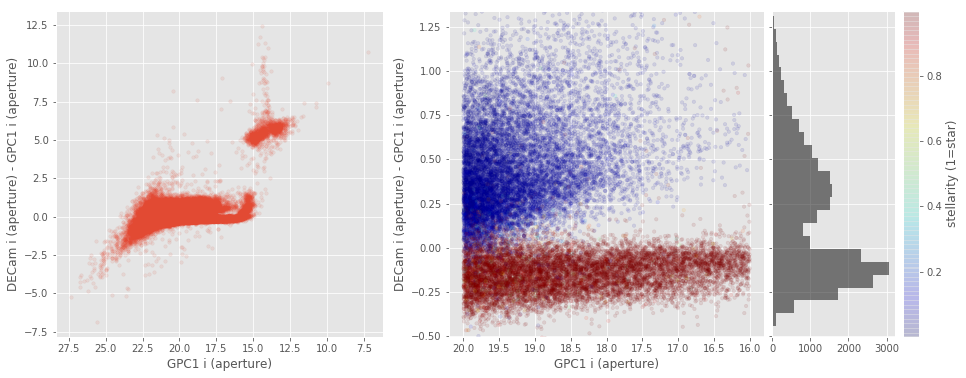

DECam i (aperture) - OmegaCAM i (aperture):


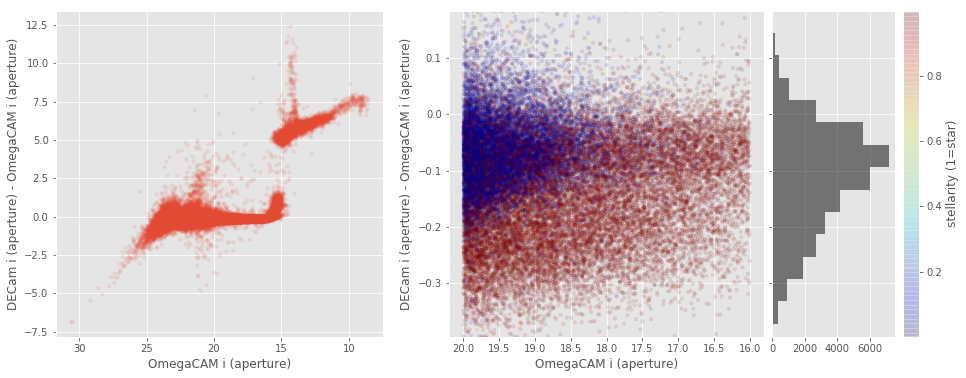

OmegaCAM z (aperture) - GPC1 z (aperture):


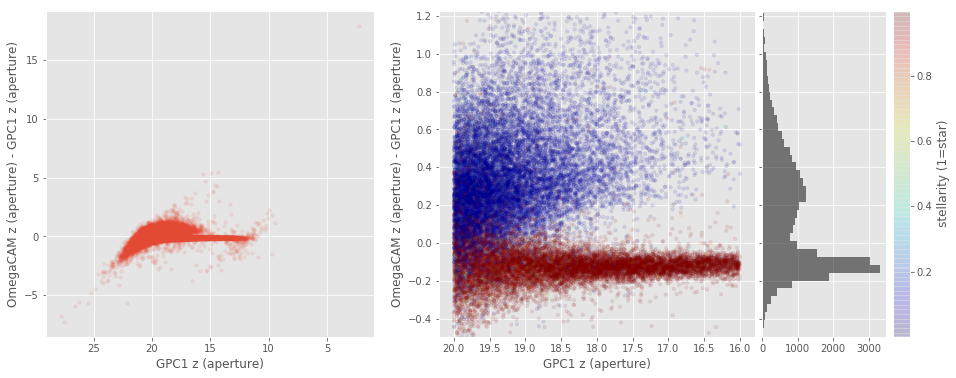

DECam z (aperture) - GPC1 z (aperture):


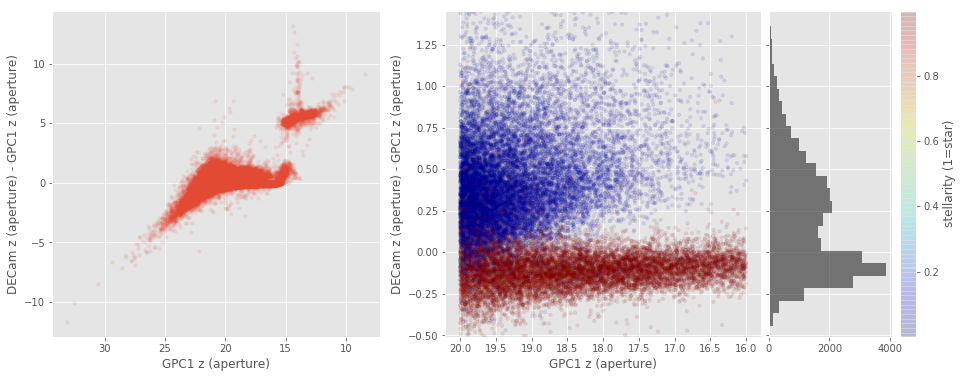

VISTA Z (aperture) - GPC1 z (aperture):


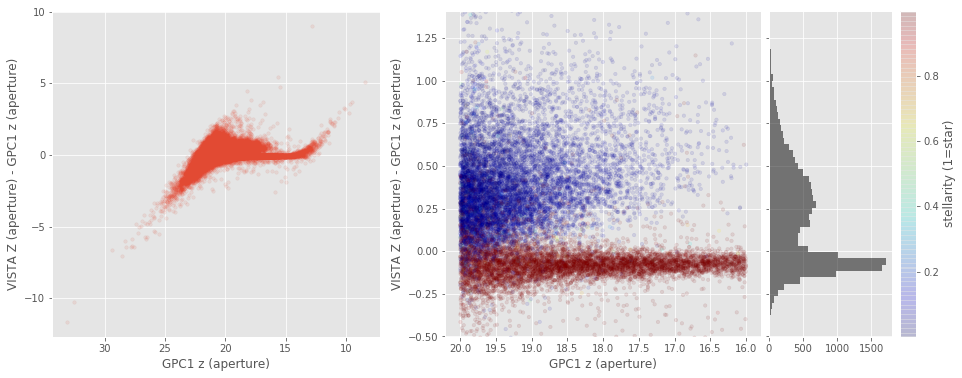

DECam z (aperture) - OmegaCAM z (aperture):


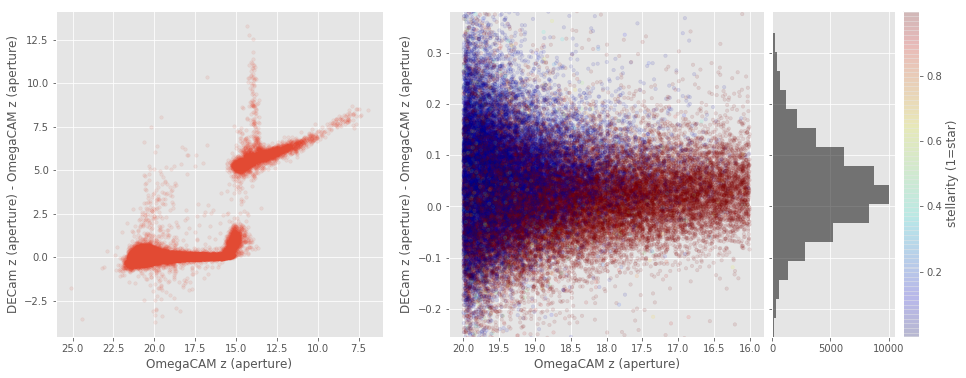

VISTA Z (aperture) - OmegaCAM z (aperture):


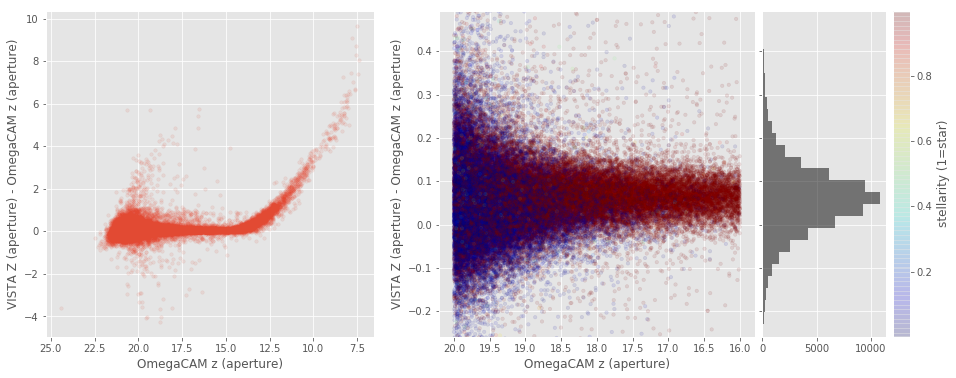

VISTA Z (aperture) - DECam z (aperture):


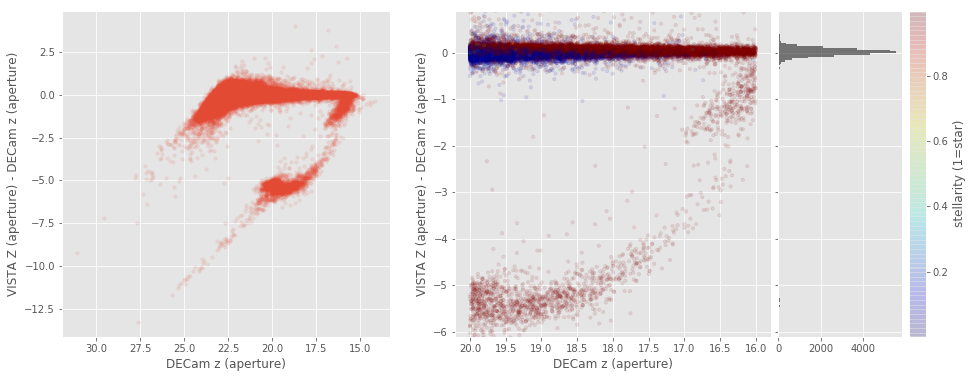

DECam y (aperture) - GPC1 y (aperture):


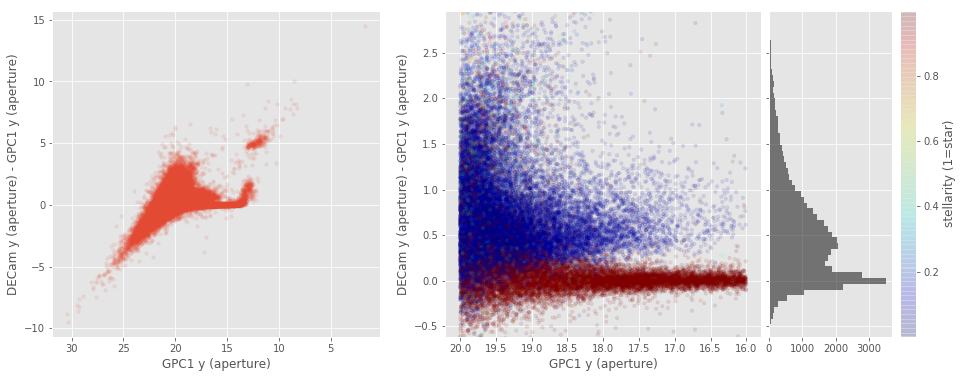

VISTA Y (aperture) - GPC1 y (aperture):


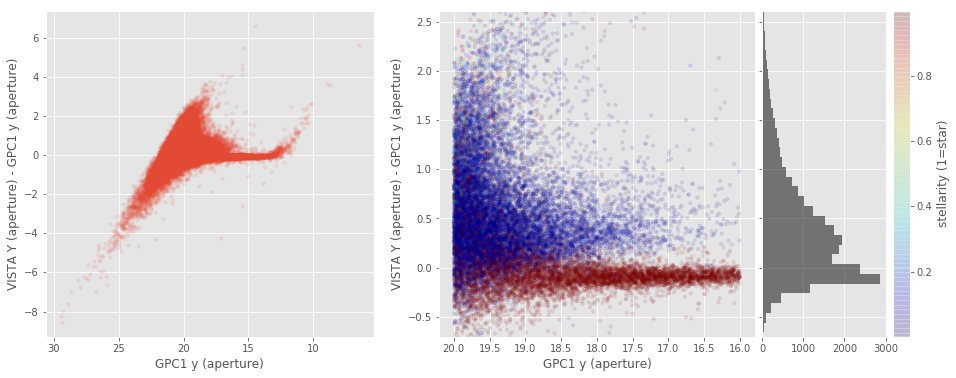

VISTA Y (aperture) - DECam y (aperture):


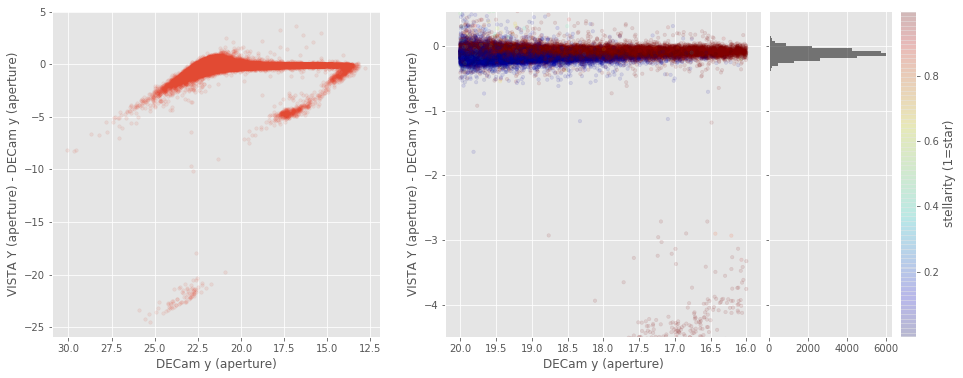

In [53]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if (basecol1 == "gpc1_r" and basecol2 == "decam_r"):
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

for j in range(40):
    plt.close() 